# *rest2vec*: Vectorizing the resting-state functional connectome using graph embedding
By Zachery D. Morrissey, Liang Zhan, Olusola Ajilore, and Alex D. Leow

# 0. Imports and settings

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as patches
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.io import loadmat
from scipy.interpolate import griddata
from sklearn.metrics.pairwise import euclidean_distances as edist
from scipy.spatial.distance import euclidean
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import nibabel as nib
import os
import networkx as nx
import bct
from sklearn.manifold import Isomap
from sklearn.metrics import normalized_mutual_info_score as nmi
from nilearn.plotting import (plot_connectome, 
                              plot_anat, plot_stat_map, 
                              plot_surf_stat_map,
                              plot_glass_brain)
from nilearn import surface
from nilearn import datasets
from nipype.interfaces import fsl
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.weightstats import ttest_ind
from matplotlib.ticker import MaxNLocator
import rest2vec as r2v

200512-19:47:51,554 nipype.utils INFO:
	 Running nipype version 1.3.0-rc1 (latest: 1.4.2)


## 0.1 Plot aesthetics

In [2]:
# Inspired by: https://stackoverflow.com/questions/3899980/how-to-change-the-font-size-on-a-matplotlib-plot#3900167

# Fonts
# -----
sns.set(style='ticks')
vermillion = '#E34234'
etred = '#DC2828'

small_size = 10
medium_size = 12
large_size = 16

matplotlib.rc('text', usetex=True)              # use LaTeX interpreter
matplotlib.rc('font', family='serif')           # serif-style fonts
matplotlib.rc('font', serif='Computer Modern')  # Computer Modern font
matplotlib.rc('font', size=small_size)          # controls default text sizes
matplotlib.rc('axes', titlesize=medium_size)    # fontsize of the axes title
matplotlib.rc('axes', labelsize=medium_size)    # fontsize of the x and y labels
matplotlib.rc('xtick', labelsize=small_size)    # fontsize of the tick labels
matplotlib.rc('ytick', labelsize=small_size)    # fontsize of the tick labels
matplotlib.rc('legend', fontsize=small_size)    # legend fontsize
matplotlib.rc('figure', titlesize=large_size)   # fontsize of the figure title
matplotlib.rc('svg', fonttype='none')

width = 470  # textwidth (pt) for 1 inch LaTeX article class document

# Dataset titles
# --------------
titles = ['F1000 dataset', 'Diez dataset'] 


# Plot helper functions
# ---------------------
def normalize(x):
    """Transform vector of continuous data to be between [0, 1]. 
    Intended for setting alpha values in scatter plots.
    
    Parameters
    ----------
    x : numpy vector or array
        N x 1 array to transform.
        
    Returns
    -------
    normalized_x : numpy vector
        N x 1 array of x between [0, 1]
    """
    
    return ((x - min(x)) / (max(x) - min(x)))

    
def square_ax(ax):
    """Set aspect ratio to make square box for axes.
    
    Parameter
    ---------
    ax : matplotlib axes
        Axes to make square aspect ratio.
        
    Returns
    -------
    ratio : float
        Ratio to be given to axes.set_aspect() function.
    """
    
    x0, x1 = ax.get_xlim()
    y0, y1 = ax.get_ylim()
    
    return (x1 - x0) / (y1 - y0)


def create_node_colors(labels):
    """Given a community assignment vector, returns a corresponding
    3D node color array based off of the default matplotlib discrete
    color palette for use with plotting (e.g. scatter).
    
    Parameters
    ----------
    labels : numpy array 
        Community assignment vector of size N (assumes zero-index).
        
    Returns
    -------
    node_colors : numpy array
        N x 3 array of RGB values corresponding to the default 
        matplotlib discrete color palette.
    """
    
    K = len(np.unique(labels))  # number of communities
    cmap = np.array(matplotlib.cm.tab10.colors[:K])
        
    node_colors = np.zeros([len(labels), 3])
    node_colors = cmap[labels.astype(int)]
    
    return node_colors


def coord_polar(mat):
    """Convert 2D array from Cartesian (x, y) coordinates to
    polar (r, theta) coordinates.
    
    Parameters
    ----------
    mat : numpy array
        N x 2 array of Cartesian coordinates.
        
    Returns
    -------
    r : numpy vector
        Polar radius vector of size N.
    
    theta : numpy vector
        Polar angle vector of size N.
    """
    x = mat[:, 0].copy()
    y = mat[:, 1].copy()

    r = np.sqrt(x**2 + y**2)
    theta = np.arctan2(y, x)

    return r, theta


def create_N_colors(N, palette=matplotlib.cm.tab10.colors):
    """Get N colors from color palette.
    
    Parameters
    ----------
    N : int
        Number of distinct colors.
        
    palette : matplotlib colormap
        Colormap to choose colors from (tab10 by default).
        
    Returns
    -------
    node_colors : numpy array
        N x 3 numpy array of RGB values.
    """
    
    node_colors = np.array(palette[:N])   
    
    return node_colors


def set_size(width, fraction=1, subplots=(1, 1)):
    """ Set figure dimensions to avoid scaling in LaTeX [1].

    Parameters
    ----------
    width : float or string
            Document width in points, or string of predined document type
    fraction : float, optional
            Fraction of the width which you wish the figure to occupy
    subplots : array-like, optional
            The number of rows and columns of subplots.
    Returns
    -------
    fig_dim : tuple
            Dimensions of figure in inches
            
    References
    ----------
    [1] https://jwalton.info/Embed-Publication-Matplotlib-Latex/
    """
    
    if width == 'thesis':
        width_pt = 426.79135
    elif width == 'beamer':
        width_pt = 307.28987
    elif width == 'pnas':
        width_pt = 246.09686
    else:
        width_pt = width

    # Width of figure (in pts)
    fig_width_pt = width_pt * fraction
    # Convert from pt to inches
    inches_per_pt = 1 / 72.27

    # Golden ratio to set aesthetic figure height
    golden_ratio = (5**.5 - 1) / 2

    # Figure width in inches
    fig_width_in = fig_width_pt * inches_per_pt
    # Figure height in inches
    fig_height_in = fig_width_in * golden_ratio * (subplots[0] / subplots[1])

    return (fig_width_in, fig_height_in)

In [3]:
# Dev only: Execute if changes were made to rest2vec.py after importing
import importlib
importlib.reload(r2v)

<module 'rest2vec' from '/home/zdm/Lab/Projects/PhASE/rest2vec.py'>

## 0.2 Set project root path

In [4]:
# Set path (assumes notebook is in top parent folder)
path = os.path.abspath('.')
path

'/home/zdm/Lab/Projects/PhASE'

# 1. Import data

Data is taken from the [Functional 1000 Connectomes Project](http://umcd.humanconnectomeproject.org/umcd/default/index]]) and [NITRC]([[https://www.nitrc.org/projects/biocr_hcatlas/]]).

In [5]:
# 177 ROI group data
f1000_data = loadmat(f'{path}/data/F1000_NW.mat')
NW = f1000_data['NW']  # N x N x num_subjects Pearson correlation connectomes

# MNI coordinates and labels for regions
roi_xyz = pd.read_csv(f'{path}/data/F1000_roi_xyz.csv', names=['x', 'y', 'z'], squeeze=True)
roi_names = pd.read_csv(f'{path}/data/F1000_roi_labels.csv', names=['roi'], squeeze=True)


# Subject demographics
age = pd.read_csv(f'{path}/data/F1000_subject_age.csv', header=None, squeeze=True)
sex = pd.read_csv(f'{path}/data/F1000_subject_sex.csv', header=None, squeeze=True)

subject_info = pd.DataFrame({'age': age, 'sex': sex})
subject_info.groupby('sex').describe()

age                                                       
        count       mean        std   min   25%   50%      75%   max
sex                                                                 
Female  560.0  27.875929  12.744147  18.0  21.0  22.0  27.0850  85.0
Male    426.0  28.714718  12.717932  18.0  21.0  23.0  30.9575  74.0

Statistical differences in age between males and females?

In [6]:
male_age = subject_info.loc[subject_info['sex'] == 'Male', 'age'].to_numpy()
female_age = subject_info.loc[subject_info['sex'] == 'Female', 'age'].to_numpy()

tstat, pvalue, df = ttest_ind(male_age, female_age)
print(f't = {tstat}\np = {pvalue}\ndf = {df}')

t = 1.0246805224882132
p = 0.3057657882544266
df = 984.0


In [7]:
male_age.mean() - female_age.mean()

0.8387897384305845

MNI labels for the Diez dataset ROIs were calculated using the [label4MRI](https://github.com/yunshiuan/label4MRI) package for `R`.

In [8]:
# Load 2514 group data
h2514_data = loadmat(f'{path}/data/2514_NW.mat')
h_roi_xyz = pd.read_csv(f'{path}/data/2514_roi_xyz.csv', header=None, 
                        squeeze=True, names=['x', 'y', 'z'])
h_roi_names = pd.read_csv(f'{path}/data/2514_mni_labels.csv', squeeze=True)

hNW = h2514_data['hNW']

# 2. Results

## 2.1 Compute embedding data

In [9]:
f1000 = r2v.PhaseEmbedding(NW, roi_xyz, roi_names)

In [10]:
# NOTE: This may take a few minutes to run due to large matrix size
h2514 = r2v.PhaseEmbedding(hNW, h_roi_xyz, h_roi_names)  # Diez dataset

/home/zdm/Lab/Projects/PhASE/rest2vec.py:85: RuntimeWarning: divide by zero encountered in true_divide
  return np.arctan(np.sqrt(self.P / (1 - self.P)))


### Example matrix figures for Inkscape

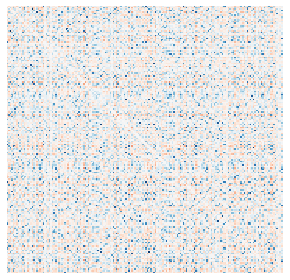

In [11]:
sns.heatmap(f1000.avg_nw, cmap='RdBu', center=0, cbar=False, rasterized=True, square=True)
plt.tick_params(axis='both', which='both', bottom=False, left=False,
                labelbottom=False, labelleft=False)
plt.tight_layout()
plt.savefig(f'{path}/figures/inkscape/avg-nw-mat.png', dpi=300, transparent=True)

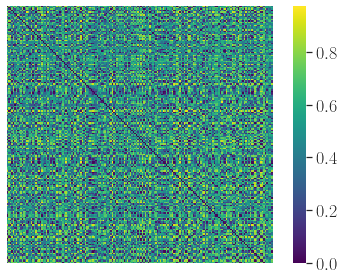

In [12]:
im = sns.heatmap(f1000.P, cmap='viridis', rasterized=True, square=True)
plt.tick_params(axis='both', which='both', bottom=False, left=False,
                labelbottom=False, labelleft=False)

cbar = im.collections[0].colorbar
cbar.ax.tick_params(labelsize=18)
plt.tight_layout()
plt.savefig(f'{path}/figures/inkscape/P-mat.png', dpi=300, transparent=True)

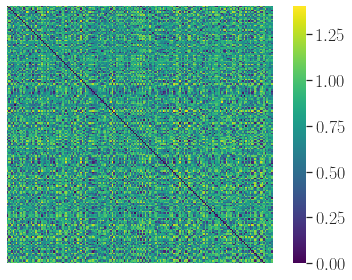

In [13]:
im = sns.heatmap(f1000.theta, cmap='viridis', rasterized=True, square=True)
plt.tick_params(axis='both', which='both', bottom=False, left=False,
                labelbottom=False, labelleft=False)

cbar = im.collections[0].colorbar
cbar.ax.tick_params(labelsize=18)
plt.tight_layout()
plt.savefig(f'{path}/figures/inkscape/theta-mat.png', dpi=300, transparent=True)

MMD distribution example for pipeline figure.

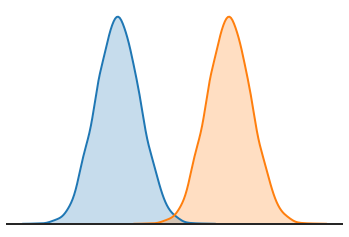

In [14]:
np.random.seed(0)  # initialize seed at same position

# Create fake data
x = np.random.normal(loc=1, size=5000)
y = x + 5
data = [x, y]
colors = create_N_colors(2)

# Build plot
f, ax = plt.subplots()

for i in range(2):
    sns.kdeplot(data=data[i], shade=True, color=colors[i],
               linewidth=2)

# Plot aesthetics
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set(linewidth=2)
ax.get_xaxis().set_ticks([])
ax.get_yaxis().set_ticks([])

f.savefig(f'{path}/figures/mmd-example.svg', dpi=300)

## 2.2 $\mathbf{W}$, $\mathbf{P}^{-}$, $\Theta$, and $\mathbf{K}$ matrices

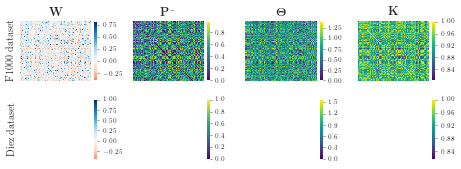

In [15]:
# Preset figure size
# -----------------------
# 177 and 2514 ROI P, Theta, and K matrices
mats = [f1000.avg_nw, f1000.P, f1000.theta, f1000.K,
        h2514.avg_nw, h2514.P, h2514.theta, h2514.K]

subtitles = ['$\\mathbf{W}$', '$\\mathbf{P}^{-}$', '$\\mathbf{\\Theta}$','$\\mathbf{K}$']

row_idx, col_idx = np.unravel_index(np.arange(8), shape=(2, 4))

fig_width_in, fig_height_in = set_size(width)
f, ax = plt.subplots(nrows=2, figsize=(fig_width_in, 2.5), ncols=4)

for idx, (i, j) in enumerate(zip(row_idx, col_idx)):
    
    if j == 0:
        # Pearson correlation connectome
        im = sns.heatmap(mats[idx], cmap='RdBu', square=True,
                         center=0, ax=ax[i, j], rasterized=True,
                         cbar_kws={'fraction': 0.038, 'pad': 0.04})
        
        ax[i, j].set_ylabel(titles[i], fontsize=10)  # column labels
        
    else:
        # P, theta, K
        im = sns.heatmap(mats[idx], cmap='viridis', ax=ax[i, j], 
                         rasterized=True, square=True,
                         cbar_kws={'fraction': 0.038, 'pad': 0.04})
    
    # Remove ticks and ticklabels
    ax[i, j].tick_params(axis='both', which='both', bottom=False, left=False,
                         labelbottom=False, labelleft=False)
    
    # Colorbar label size
    cbar = im.collections[0].colorbar
    cbar.ax.tick_params(labelsize=6, size=2, width=0.5)

    if i == 0:
        ax[i, j].set_title(subtitles[j], fontsize=12)  # row labels
               
f.tight_layout()
f.savefig(f'{path}/figures/heatmaps-1in-width.png', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/heatmaps-1in-width.pdf', dpi=300, bbox_inches='tight')

## 2.4 Modularity

### MMD modularity

Iterate the value of the MMD at various cut sites along the top eigenvector of the centered kernel similarity matrix $\left(\mathbf{\tilde{K}}\right)$.

In [16]:
def eval_cuts(embedding, n_cuts=50):
    """Evaluate MMD at various cut thresholds along qmax.
    
    Parameters
    ----------
    embedding : rest2vec object
        rest2vec.phase_embedding object containing embedding data.
        
    n_cuts : integer
        Number of thresholds of qmax to evaluate (default = 50).
        
    Returns
    -------
    df_mmd : pandas dataframe
        Dataframe containing of observed MMD at each cut site.
    """
    
    cut_sites = np.linspace(start=embedding.qmax.min(), 
                            stop=embedding.qmax.max(), 
                            num=n_cuts)
    
    mmd = np.zeros([len(cut_sites)])
    ratio = np.zeros_like(mmd)
    
    m = np.zeros_like(mmd)
    n = np.zeros_like(mmd)
    N = len(embedding.roi_xyz)

    for i, cut in enumerate(cut_sites):
        m[i] = np.sum(embedding.qmax >= cut)
        n[i] = np.sum(embedding.qmax < cut)
        ratio[i] = m[i] / N
        
        # Equation 13
        vstar = embedding.qmax.copy()[:, np.newaxis]
        vstar[embedding.qmax >= cut] = np.sqrt((m[i] * n[i]) / N) * (1 / m[i])
        vstar[embedding.qmax < cut] = np.sqrt((m[i] * n[i]) / N) * (-1 / n[i])
        mmd[i] = (4/N) * (vstar.T @ embedding.Kcen @ vstar)
  
    df_mmd = pd.DataFrame({'n': n, 
                           'm': m, 
                           'm/N': m/N, 
                           'cut': cut_sites, 
                           'mmd': mmd})
    
    df_mmd = pd.melt(df_mmd, id_vars=['cut', 'mmd', 'm/N'], value_vars=['n', 'm'],
                     var_name='partition', value_name='size')
    
    return df_mmd


df_mmd_f1000 = eval_cuts(f1000, n_cuts=50)
df_mmd_h2514 = eval_cuts(h2514, n_cuts=50)

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: divide by zero encountered in double_scalars
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


Plot histogram of top eigenvector, partition size as a function of cut site, and MMD value as a function of cut site.

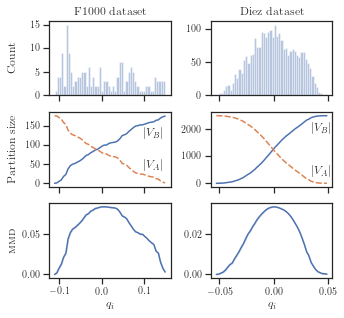

In [17]:
f, ax = plt.subplots(nrows=3, 
                     ncols=2, 
                     figsize=set_size(width, fraction=0.75, subplots=(3, 2)), 
                     sharex='col') 

dists = [f1000.qmax, h2514.qmax]
dfs = [df_mmd_f1000, df_mmd_h2514]

for i in range(2):
    # Distribution of qmax
    sns.distplot(dists[i], bins=50, kde=False, ax=ax[0, i])

    # Cut site vs partition size line plot
    sns.lineplot(x='cut', y='size', hue='partition', style='partition',
                 data=dfs[i], linewidth=1.5, ax=ax[1, i], legend=False)
    
    # Cut site vs MMD line plot
    sns.lineplot(x='cut', y='mmd', linewidth=1.5, ax=ax[2, i], data=dfs[i])
    
    # Axes labels
    if i == 0:
        # 177 ROI column
        ax[0, i].set_ylabel('Count')
        ax[0, i].set_title(titles[i])
        ax[0, i].locator_params(axis='y', nbins=4)  # i.e., 3 tick breaks   
        ax[1, i].set_ylabel('Partition size')
        ax[1, i].locator_params(axis='y', nbins=4)     
        ax[2, i].set_xlabel('$q_{i}$')
        ax[2, i].set_ylabel('\\textsc{mmd}')
        
    if i == 1:
        # 2514 ROI column (sharex along columns, so remove y-axis labels)
        ax[0, i].set_ylabel('')
        ax[0, i].set_title(titles[i])    
        ax[1, i].set_ylabel('')       
        ax[2, i].set_xlabel('$q_{i}$')
        ax[2, i].set_ylabel('')
        
# Annotate partition labels directly on line plots
annotation_size = 12
ax[1, 0].annotate('$|V_{B}|$', xy=(0.1, 120), fontsize=annotation_size)
ax[1, 0].annotate('$|V_{A}|$', xy=(0.1, 35), fontsize=annotation_size)
ax[1, 1].annotate('$|V_{B}|$', xy=(0.035, 1900), fontsize=annotation_size)
ax[1, 1].annotate('$|V_{A}|$', xy=(0.035, 300), fontsize=annotation_size)
        
f.align_ylabels()
f.tight_layout()
f.savefig(f'{path}/figures/qmax-and-mmd-partition-size-1in-width.png', 
          dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/qmax-and-mmd-partition-size-1in-width.pdf', 
          dpi=300, bbox_inches='tight')

Eigenvalues of $\tilde{\mathbf{K}}$

In [18]:
f_evals, f_evecs = np.linalg.eig(f1000.Kcen)
h_evals, h_evecs = np.linalg.eig(h2514.Kcen)

evecs = [f_evecs, h_evecs]
evals = [f_evals, h_evals]

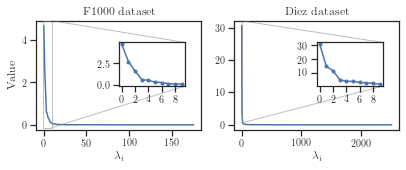

In [19]:
mats = [f1000.Kcen, h2514.Kcen]

f, ax = plt.subplots(ncols=2, 
                     figsize=set_size(width, subplots=(1, 2)))

for i in range(2):
    ax[i].plot(np.arange(len(evals[i])), evals[i], linewidth=1.5)
    ax[i].set_xlabel('$\\lambda_{i}$')
    ax[i].set_title(titles[i])
    
    if i == 0:
        ax[i].set_ylabel('Value')

    # Inset
    num_evals = 10
    axins = ax[i].inset_axes([0.5, 0.4, 0.4, 0.4])
    axins.plot(np.arange(num_evals), evals[i][:num_evals], 
               '-o', linewidth=1.5, markersize=3)
    axins.xaxis.set_major_locator(MaxNLocator(5, integer=True))  # force integer xticks
    ax[i].indicate_inset_zoom(axins)


f.savefig(f'{path}/figures/kcen-evals-1in-width.png', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/kcen-evals-1in-width.pdf', dpi=300, bbox_inches='tight')

### Glass brain visualization of MMD modularity

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:1766: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if node_color == 'auto':
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.8086116487941177. But, you have given threshold=1 
  threshold))
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.901382345271923. But, you have given threshold=1 
  threshold))
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


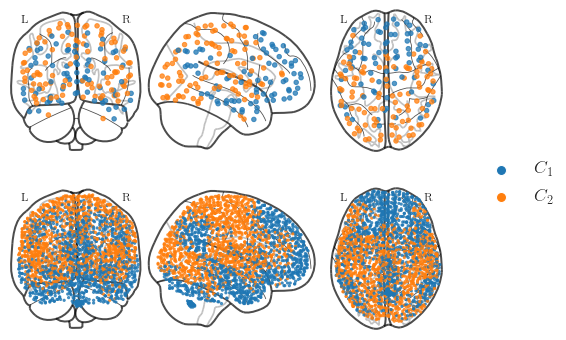

In [20]:
# Connectome plot aesthetics
# --------------------------
s = [20, 5]
alpha = 0.75
edge_threshold = 1  # turn off edges

f, ax = plt.subplots(nrows=2, figsize=(8, 6))
  
# 177 ROI plot
# ------------
cmap = np.array(matplotlib.cm.tab10.colors[:len(np.unique(f1000.mod))])

node_color = create_node_colors(f1000.mod)

plot_connectome(f1000.avg_nw, node_coords=f1000.roi_xyz, node_size=20, 
                node_color=node_color, colorbar=False, edge_threshold=1, 
                node_kwargs={'alpha': 0.75}, axes=ax[0])

custom_lgd = [Line2D([0], [0], markerfacecolor=cmap[0], color='w', 
                     marker='o', markersize=10),
              Line2D([0], [0], markerfacecolor=cmap[1], color='w', 
                     marker='o', markersize=10)]

ax[0].legend(custom_lgd, ['$C_{1}$', '$C_{2}$'], 
             bbox_to_anchor=(1.05, 0), loc=2, borderaxespad=0.0, fontsize=18, frameon=False)


# 2514 ROI plot
# -------------
node_color = create_node_colors(1 - (h2514.mod.astype(int)))

plot_connectome(h2514.avg_nw, node_coords=h2514.roi_xyz, node_size=5, 
                node_color=node_color, colorbar=False, edge_threshold=1, 
                node_kwargs={'alpha': 0.75}, axes=ax[1])

plt.savefig(f'{path}/figures/mmd-mod-glass-brain.png', dpi=300, 
            bbox_inches='tight')

Export `.node` and `.edge` for compatibility with [BrainNet](https://www.nitrc.org/projects/bnv).

In [21]:
f1000.to_brainnet(C=f1000.mod, prefix=f'data/saved_data/r2v-brainnet-f1000-mmd-mod')
h2514.to_brainnet(C=h2514.mod, prefix=f'data/saved_data/r2v-brainnet-2514-mmd-mod')

Saved ./data/saved_data/r2v-brainnet-f1000-mmd-mod.node.
Saved ./data/saved_data/r2v-brainnet-f1000-mmd-mod.edge
Saved ./data/saved_data/r2v-brainnet-2514-mmd-mod.node.
Saved ./data/saved_data/r2v-brainnet-2514-mmd-mod.edge


## 2.5 Dimensionality reduction

The [Isomap](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.Isomap.html) algorithm was used to reduce the dimensionality of the phase angle spatial embedding matrix $\mathbf{\Theta}$ from $N$ dimensions to 3 dimensions.

In [22]:
# 3D
f1000_isomap_embedding = Isomap(n_neighbors=12, n_components=3, path_method='D')
f1000_theta_iso = f1000_isomap_embedding.fit_transform(f1000.theta)

h2514_isomap_embedding = Isomap(n_neighbors=50, n_components=3, path_method='D')
h2514_theta_iso = h2514_isomap_embedding.fit_transform(h2514.theta)

Isomap embedding 3D visualization and glass brain visualization with MMD modularity

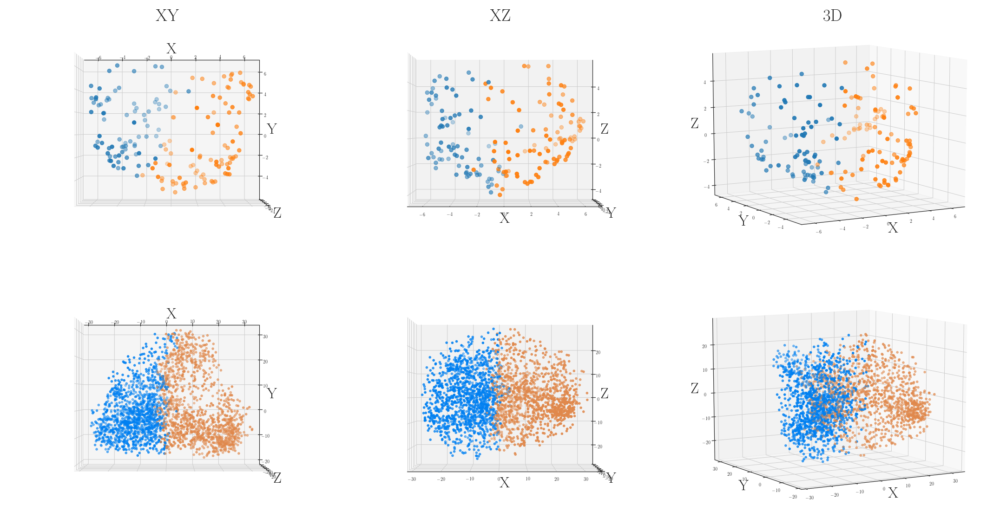

In [23]:
f = plt.figure(figsize=(30, 16))

row_idx, col_idx = np.unravel_index(np.arange(6), shape=(2, 3))
mats = [f1000_theta_iso, h2514_theta_iso]
mods = [f1000.mod.astype(int), h2514.mod.astype(int)]

# Plot aesthetics
azims = [-90, -90, -120]
elevs = [90, 0, 10]
suptitles = ['XY', 'XZ', '3D']
node_size = [70, 20]

for idx in range(6):
    i = row_idx[idx]
    j = col_idx[idx]
    
    # Build color vector
    cmap = np.array(matplotlib.cm.tab10.colors[:len(np.unique(f1000.mod))])

    if i == 0:
        node_color = cmap[mods[i]]
    else:
        node_color = 1 - cmap[mods[i]]  # swap 2514 mods to match 177 mods
            
    # Build 3D scatter plot
    ax = f.add_subplot(2, 3, idx + 1, projection='3d')
    
    im = ax.scatter(mats[i][:, 0], mats[i][:, 1], mats[i][:, 2], 
                    c=node_color, s=node_size[i])
    
    if i == 0:
        # Column titles across top row
        ax.set_title(suptitles[j], fontsize=36)
        
    # Axis labels
    ax.set_xlabel('X', fontsize=32)
    ax.set_ylabel('Y', fontsize=32)
    ax.set_zlabel('Z', fontsize=32)
        
    # Set #D view angle
    ax.azim = azims[j]
    ax.elev = elevs[j]
    
f.tight_layout()
f.savefig(f'{path}/figures/isomap-mmd-mod.png', dpi=300)

## 2.6 Distance to origin

The distance to the origin of the 3D isomap embedding space was computed for all ROIs for each dataset.

In [24]:
f1000_D = edist(f1000_theta_iso, np.array([[0, 0, 0]])).flatten()
h2514_D = edist(h2514_theta_iso, np.array([[0, 0, 0]])).flatten()

### Isomap 3D visualization of each ROI colored by its distance to the origin of the 3D isomap space for each dataset.

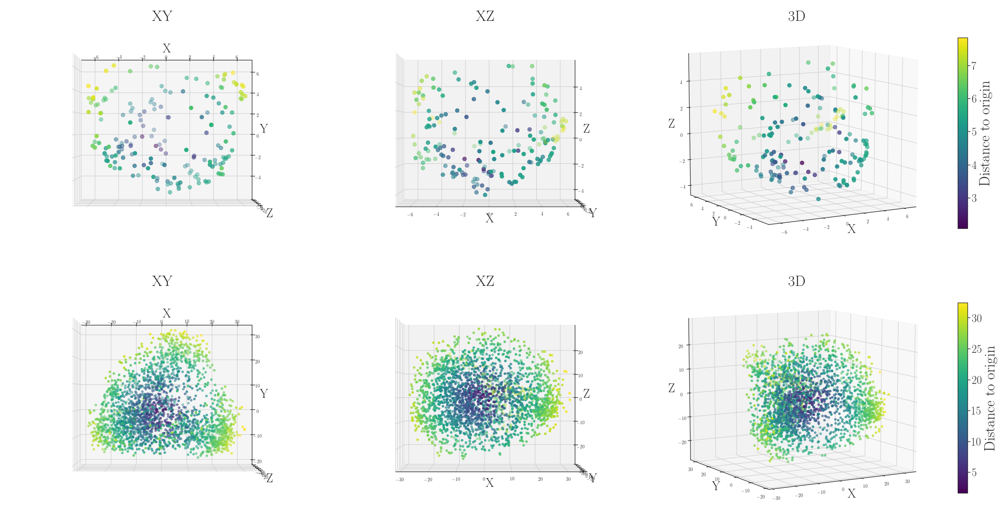

In [25]:
f = plt.figure(figsize=(30, 16))

row_idx, col_idx = np.unravel_index(np.arange(6), shape=(2, 3))

mats = [f1000_theta_iso, h2514_theta_iso]
mods = [f1000.mod.astype(int), h2514.mod.astype(int)]
D = [f1000_D, h2514_D]

# Plot aesthetics
node_size = [70, 20]
azims = [-90, -90, -120]
elevs = [90, 0, 10]
suptitles = ['XY', 'XZ', '3D']


for idx in range(6):
    i = row_idx[idx]
    j = col_idx[idx]
            
    # Build 3D scatter plot
    ax = f.add_subplot(2, 3, idx + 1, projection='3d')
    
    im = ax.scatter(mats[i][:, 0], mats[i][:, 1], mats[i][:, 2], 
                     c=D[i], s=node_size[i], cmap='viridis')
    
    if j == 2:
        # Add colorbar
        cbar = f.colorbar(im, fraction=0.03, pad=0.04)
        cbar.ax.tick_params(labelsize=24)
        cbar.ax.set_ylabel('Distance to origin', fontsize=32)
    
    # Subplot titles
    ax.set_title(suptitles[j], fontsize=32)
    
    # Axis labels
    ax.set_xlabel('X', fontsize=26)
    ax.set_ylabel('Y', fontsize=26)
    ax.set_zlabel('Z', fontsize=26)
    
    # Set view angle
    ax.azim = azims[j]
    ax.elev = elevs[j]
        
f.tight_layout()
f.savefig(f'{path}/figures/isomap-dist-to-origin.png', dpi=300)

### Glass brain visualization of each ROI's distance to the origin of the 3D isomap embedding.

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:1766: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if node_color == 'auto':
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.8086116487941177. But, you have given threshold=1 
  threshold))
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.901382345271923. But, you have given threshold=1 
  threshold))


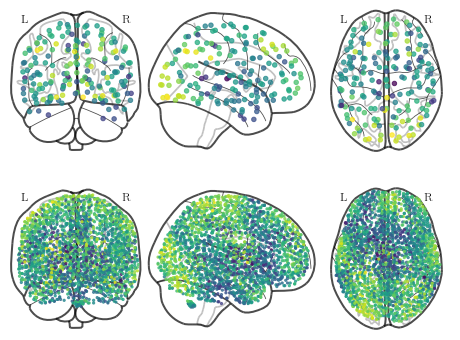

In [26]:
# Connectome plot aesthetics
s = [20, 5]
alpha = 0.75
edge_threshold = 1  # hack to turn off edges

f, ax = plt.subplots(nrows=2, figsize=(8, 6))
  
# 177 ROI plot
im = plot_connectome(f1000.avg_nw, node_coords=f1000.roi_xyz, node_size=20, 
                node_color=f1000_D, colorbar=False, edge_threshold=1, 
                node_kwargs={'alpha': alpha, 'cmap': 'viridis'}, axes=ax[0])

# 2514 ROI plot
cmap = np.array(matplotlib.cm.tab10.colors[:len(np.unique(f1000.mod))])
node_color = cmap[1 - h2514.mod.astype(int)]  # flip colors to match F1000

plot_connectome(h2514.avg_nw, node_coords=h2514.roi_xyz, node_size=5, 
                node_color=h2514_D, colorbar=False, edge_threshold=1, 
                node_kwargs={'alpha': alpha, 'cmap': 'viridis'}, axes=ax[1])

plt.savefig(f'{path}/figures/isomap-dist-to-origin-glass-brain.png', dpi=300, 
            bbox_inches='tight')

plt.savefig(f'{path}/figures/isomap-dist-to-origin-glass-brain.svg', dpi=300, 
            bbox_inches='tight')

Build dataframe of distance values for each ROI for each dataset.

In [27]:
f1000_dist_df = pd.DataFrame({'roi': f1000.roi_names, 
                              'D': f1000_D, 
                              'D_sort_idx': np.argsort(f1000_D), \
                              'mod': f1000.mod.astype(int).astype(str)})

# Clean ROI names and create hemisphere labels
f1000_dist_df['hemi'] = np.where(f1000_dist_df['roi'].str[0] == 'L', 'Left', 'Right')
f1000_dist_df.loc[f1000_dist_df['roi'] == 'Brain-Stem', 'hemi'] = 'Brain-Stem'
f1000_dist_df.loc[f1000_dist_df['roi'] != 'Brain-Stem', 'roi'].str.split(r'Left|Right').str[1]
f1000_dist_df = f1000_dist_df.sort_values('D')
f1000_dist_df.to_csv(f'{path}/data/saved_data/f1000_dist_df.csv', index=False)  # export to R
f1000_dist_df.head(10)

,roi,D,D_sort_idx,mod,hemi
15,Right Thalamus,2.075557,148,0,Right
38,Left Thalamus,2.477479,132,0,Left
103,Left Middle Temporal Gyrus temporooccipital part,2.669218,3,1,Left
59,Right Middle Temporal Gyrus temporooccipital part,3.022016,122,1,Right
5,Right Precuneous Cortex,3.103870,66,1,Right
66,Left Cingulate Gyrus posterior division,3.143211,163,1,Left
34,Right Middle Temporal Gyrus temporooccipital part,3.171409,46,0,Right
174,Right Temporal Fusiform Cortex anterior division,3.224404,39,1,Right
24,Left Parahippocampal Gyrus anterior division,3.239824,144,1,Left
173,Left Precuneous Cortex,3.314796,154,1,Left


In [28]:
f1000_dist_df.tail(10)

,roi,D,D_sort_idx,mod,hemi
124,Right Occipital Pole,7.333012,11,1,Right
37,Right Occipital Pole,7.353985,14,1,Right
169,Left Superior Frontal Gyrus,7.469206,169,0,Left
146,Right Lateral Occipital Cortex superior division,7.566694,16,0,Right
139,Left Occipital Pole,7.612705,95,1,Left
155,Right Lateral Occipital Cortex inferior division,7.624510,0,1,Right
154,Left Precuneous Cortex,7.636063,45,0,Left
39,Right Cingulate Gyrus posterior division,7.649487,109,0,Right
70,Left Lateral Occipital Cortex superior division,7.810732,10,0,Left
171,Right Lingual Gyrus,7.840184,139,1,Right


In [29]:
h2514_dist_df = pd.DataFrame({'D': h2514_D, 'D_sort_idx': np.argsort(h2514_D)}).sort_values('D')

Lineplot of sorted ROI distance to the origin for each dataset.

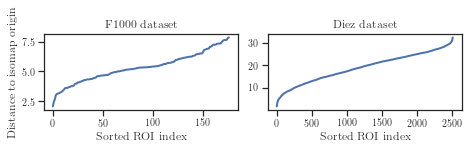

In [30]:
f, ax = plt.subplots(ncols=2, figsize=set_size(width, subplots=(1, 2)))
mats = [f1000_dist_df, h2514_dist_df]

for i in range(len(mats)):
    ax[i].plot(np.arange(len(mats[i]['D'])), mats[i]['D'], linewidth=2)
    ax[i].set_xlabel('Sorted ROI index')
    ax[i].set(title=titles[i])
    
ax[0].set(ylabel='Distance to isomap origin')
#ax[1].set(ylim=(0, 35))

f.tight_layout()
f.savefig(f'{path}/figures/isomap-dist-to-origin-lineplot.png', dpi=300)

Clean Diez dataset labels for analysis.

In [31]:
h2514_roi_info = pd.read_csv(f'{path}/data/2514-roi-hemi-lobe-info.csv')

# Create hemisphere and lobe variables
h2514_dist_df = (
    h2514_dist_df
    .sort_index()
    .assign(roi=h2514_roi_info['roi'])
    .assign(lobe=h2514_roi_info['lobe'])
    .assign(hemi=h2514_roi_info['hemi'])
    .assign(mod=pd.Series(h2514.mod.astype(int)), dtype='category')
    .assign(x=h2514.roi_xyz['x'])
    .assign(y=h2514.roi_xyz['y'])
    .assign(z=h2514.roi_xyz['z']))  

h2514_dist_df

,D,D_sort_idx,roi,lobe,hemi,mod,dtype,x,y,z
0,24.655041,1316,Heschl,Sub-lobar,R,0,category,51,-10,5
1,16.697256,406,ParaHippocampal,Limbic Lobe,R,1,category,23,-5,-23
2,27.192061,543,Precentral,Frontal Lobe,L,0,category,-27,-22,61
3,20.907091,238,Cuneus,Occipital Lobe,L,0,category,-14,-77,33
4,21.455696,2390,Frontal_Mid_Orb,Frontal Lobe,L,0,category,-40,45,-2
5,25.681497,7,Occipital_Inf,Occipital Lobe,R,1,category,41,-84,-7
6,26.079350,2445,Supp_Motor_Area,Frontal Lobe,R,0,category,4,5,60
7,2.575981,1819,Thalamus,Sub-lobar,L,0,category,-6,-12,20
8,21.316774,2109,Temporal_Mid,Temporal Lobe,L,1,category,-64,-21,-6
9,21.845774,1417,Cerebellum,Cerebellum,R,1,category,6,-62,-42


In [32]:
h2514_dist_df.sort_values('D').head(10)

,D,D_sort_idx,roi,lobe,hemi,mod,dtype,x,y,z
1316,1.629787,930,Cingulum_Mid,Limbic Lobe,R,1,category,16,-35,43
406,1.761323,1096,Thalamus,Sub-lobar,L,1,category,-11,-17,19
543,2.077158,1736,Frontal_Inf_Tri,Frontal Lobe,L,1,category,-52,30,16
238,2.165436,2022,SupraMarginal,Parietal Lobe,L,0,category,-60,-40,31
2390,2.200015,2054,Temporal_Inf,Temporal Lobe,R,0,category,50,-40,-19
7,2.575981,1819,Thalamus,Sub-lobar,L,0,category,-6,-12,20
2445,2.764130,21,Pallidum,Sub-lobar,L,0,category,-11,8,0
1819,3.060342,1284,Thalamus,Sub-lobar,L,1,category,-11,-12,14
2109,3.232815,5,Putamen,Sub-lobar,L,0,category,-16,12,5
1417,3.454850,1533,Thalamus,Sub-lobar,L,0,category,-11,-10,19


In [33]:
h2514_dist_df.sort_values('D').tail(10)

,D,D_sort_idx,roi,lobe,hemi,mod,dtype,x,y,z
1696,31.234576,2327,Postcentral,Parietal Lobe,L,0,category,-54,-18,51
300,31.399757,2380,Occipital_Mid,Occipital Lobe,L,0,category,-17,-93,7
953,31.471588,2119,Occipital_Mid,Occipital Lobe,L,0,category,-26,-88,16
1245,31.566013,1037,Fusiform,Cerebellum,R,1,category,44,-59,-21
731,31.777719,1477,Parietal_Sup,Parietal Lobe,L,0,category,-23,-50,69
2382,31.980052,463,Postcentral,Parietal Lobe,L,0,category,-26,-34,69
1016,32.217010,542,Postcentral,Parietal Lobe,L,0,category,-33,-40,66
122,32.320560,1444,Postcentral,Parietal Lobe,L,0,category,-26,-42,69
771,32.388788,1671,Occipital_Mid,Occipital Lobe,L,0,category,-23,-86,20
2134,32.471326,2196,Postcentral,Parietal Lobe,L,0,category,-41,-36,60


Get median distance to origin for each lobe to rank.

In [34]:
medians = (h2514_dist_df[['lobe', 'D']]
           .groupby('lobe')
           .median()
           .sort_values('D')
           .reset_index())
medians

,lobe,D
0,Brainstem,10.364595
1,Sub-lobar,11.456960
2,Limbic Lobe,15.454415
3,Temporal Lobe,18.408100
4,Frontal Lobe,19.975003
5,Cerebellum,20.726678
6,Parietal Lobe,24.400154
7,Occipital Lobe,24.715809


### 2.8.3 Correlation between $\mathbf{\Theta}$ and distance to origin

In [35]:
df = pd.DataFrame({'mean_theta': f1000.theta.mean(axis=1), 
                    'normtheta': np.linalg.norm(f1000.theta, axis=1),
                    'D': f1000_D})

model = smf.ols(formula='D ~ normtheta', data=df)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      D   R-squared:                       0.534
Model:                            OLS   Adj. R-squared:                  0.532
Method:                 Least Squares   F-statistic:                     200.7
Date:                Tue, 12 May 2020   Prob (F-statistic):           7.58e-31
Time:                        20:27:00   Log-Likelihood:                -215.63
No. Observations:                 177   AIC:                             435.3
Df Residuals:                     175   BIC:                             441.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -10.4116      1.112     -9.360      0.0

In [36]:
results.pvalues

Intercept    3.889622e-17
normtheta    7.584625e-31
dtype: float64

In [37]:
h_df = pd.DataFrame({'mean_theta': h2514.theta.mean(axis=1),
                     'normtheta': np.linalg.norm(h2514.theta, axis=1),
                     'D': h2514_D})

h_model = smf.ols(formula='D ~ normtheta', data=h_df)
h_results = h_model.fit()
print(h_results.summary())

                            OLS Regression Results                            
Dep. Variable:                      D   R-squared:                       0.175
Model:                            OLS   Adj. R-squared:                  0.175
Method:                 Least Squares   F-statistic:                     533.4
Date:                Tue, 12 May 2020   Prob (F-statistic):          3.48e-107
Time:                        20:27:03   Log-Likelihood:                -8002.7
No. Observations:                2514   AIC:                         1.601e+04
Df Residuals:                    2512   BIC:                         1.602e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -67.0360      3.726    -17.991      0.0

In [38]:
h_results.pvalues

Intercept     3.620011e-68
normtheta    3.482684e-107
dtype: float64

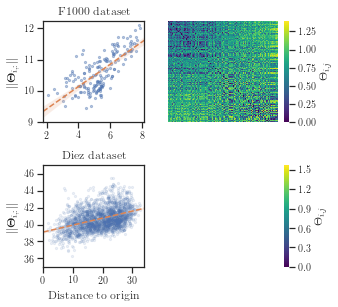

In [39]:
# Correlation between norm theta and distance to origin
fig_width_in, fig_height_in = set_size(width, fraction=0.75, subplots=(2, 2))

f, ax = plt.subplots(ncols=2, nrows=2, figsize=(fig_width_in, fig_width_in-0.5))

# F1000 dataset
sns.regplot(x='D', y='normtheta', data=df, ax=ax[0, 0], 
            scatter_kws={'alpha': 0.4, 's': 5},
            line_kws={'color': 'C1', 'linestyle': 'dashed', 'linewidth': 1.5})

ax[0, 0].set_xlabel('')
ax[0, 0].set_xticks([2, 4, 6, 8])
ax[0, 0].set_xticklabels([2, 4, 6, 8])
ax[0, 0].set_ylabel('$||{\\mathbf{\\Theta}}_{i,:}||$') 
ax[0, 0].set_yticks([9, 10, 11, 12])
ax[0, 0].set_yticklabels([9, 10, 11, 12])
ax[0, 0].set_title(titles[0])

# 2514 dataset
sns.regplot(x='D', y='normtheta', data=h_df, ax=ax[1, 0],
            color='C0', scatter_kws={'alpha': 0.1, 's': 5}, 
            line_kws={'color': 'C1', 'linestyle': 'dashed', 'linewidth': 1.5})

ax[1, 0].set_xlabel('Distance to origin')
ax[1, 0].set_xticks([0, 10, 20, 30])
ax[1, 0].set_xticklabels([0, 10, 20, 30])
ax[1, 0].set_ylabel('$||{\\mathbf{\\Theta}}_{i,:}||$')
ax[1, 0].set_yticks(np.arange(36, 47, 2))
ax[1, 0].set_yticklabels(np.arange(36, 47, 2))
ax[1, 0].set_ylim(35, 47)
ax[1, 0].set_title(titles[1])

# Make regression subplots square
ax[0, 0].set_aspect(square_ax(ax[0, 0]))
ax[1, 0].set_aspect(square_ax(ax[1, 0]))

idx = [np.argsort(df['normtheta']), np.argsort(h_df['normtheta'])]  # sorted theta matrices

for i, mat in enumerate([f1000.theta, h2514.theta]):

    im = sns.heatmap(mat[np.ix_(idx[i], idx[i])], cmap='viridis', ax=ax[i, 1], 
                     square=True, rasterized=True,
                     cbar_kws={'fraction': 0.04, 'pad': 0.04})
    
    # Remove ticks and ticklabels
    ax[i, 1].tick_params(axis='both', which='both', bottom=False, left=False,
                         labelbottom=False, labelleft=False)
    
    # Colorbar label size
    cbar = im.collections[0].colorbar
    cbar.ax.tick_params(labelsize=10)
    cbar.ax.set_ylabel('$\\Theta_{i,j}$')

f.tight_layout()
f.savefig(f'{path}/figures/dist-to-origin-theta-corr-with-mats-1in-width.png', dpi=300)
f.savefig(f'{path}/figures/dist-to-origin-theta-corr-with-mats-1in-width.pdf', dpi=300)

In [40]:
iso_xyz = h2514_theta_iso.copy()

# Save to view interactive figure outside of notebook
np.savetxt(f'{path}/data/saved_data/2514_3d_isomap.csv', iso_xyz)

## 2.7 Polar coordinates of 2D isomap embedding

In [41]:
r, theta = coord_polar(h2514_theta_iso.copy())
node_colors = create_node_colors(h2514.mod)

In [42]:
n_lobes = len(h2514_dist_df['lobe'].unique())
colors = np.array(matplotlib.cm.tab20.colors[:n_lobes])
lobes = list(h2514_dist_df['lobe'].unique())
color_dict = dict(zip(lobes, colors))

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


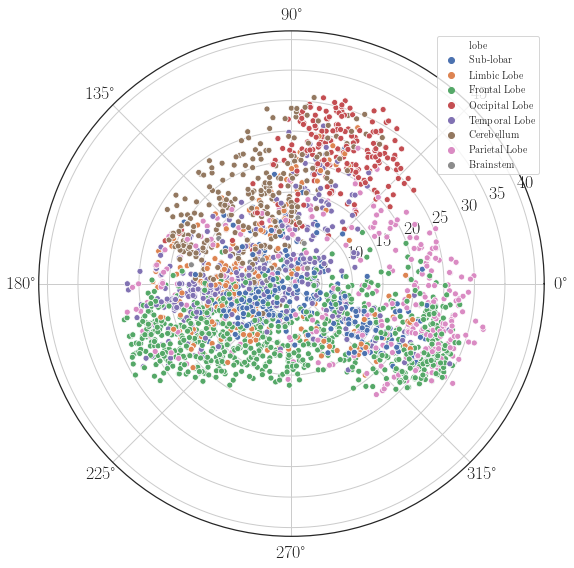

In [43]:
f = plt.figure(figsize=(8, 8))
ax = f.add_subplot(projection='polar')
g = sns.scatterplot(theta, r, ax=ax, hue=h2514_dist_df['lobe'])
ax.tick_params(labelsize=18, axis='both')

# Move legend outside of plot
# h, l = ax.get_legend_handles_labels()  # remove automatic legend title
# ax.legend(h[1:], l[1:], title='Lobe', loc='center left', bbox_to_anchor=(-0.4,  0.5), 
#           borderaxespad=0.)
f.tight_layout()
f.savefig(f'{path}/figures/2514-isomap-2d-polar-all.pdf', dpi=300)
f.savefig(f'{path}/figures/2514-isomap-2d-polar-all.png', dpi=300)
f.savefig(f'{path}/figures/2514-isomap-2d-polar-all.svg', dpi=300)

Original version of facet plot with discrete colors and universal alpha value.

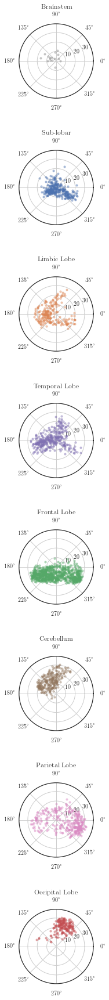

In [44]:
polar_df = pd.DataFrame({'theta': theta,
                   'r': r,
                   'lobe': h2514_dist_df['lobe'],
                   'mod': h2514.mod.astype(int)})

row_order = ('Brainstem', 'Sub-lobar', 'Limbic Lobe', 'Temporal Lobe', 'Frontal Lobe',
             'Cerebellum', 'Parietal Lobe', 'Occipital Lobe')

# Build grid and plot
g = sns.FacetGrid(polar_df, row='lobe', subplot_kws={'projection': 'polar'}, 
                  sharex=True, sharey=True, despine=False, hue='lobe',
                  row_order=row_order)

g.map(plt.scatter, 'theta', 'r', alpha=0.4, s=10) 

# Set labels
g.set_titles('{row_name}', pad=20) 
g.set_xlabels('')
g.set_ylabels('')

# Show all ticklabels with shared axes
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True, labelleft=True)
    
# Adjust spacing between rows
g.fig.subplots_adjust(hspace=0.7)

g.savefig(f'{path}/figures/2514-isomap-2d-polar.pdf', dpi=300)
g.savefig(f'{path}/figures/2514-isomap-2d-polar.png', dpi=300)
g.savefig(f'{path}/figures/2514-isomap-2d-polar.svg', dpi=300)

In [45]:
lut = dict(zip(polar_df['lobe'].unique().tolist(), np.arange(len(row_order))))
polar_df['lut'] = polar_df['lobe'].map(lut)  # map LUT values to lobe name in dataframe
polar_df

,theta,r,lobe,mod,lut
0,-0.658249,17.820937,Sub-lobar,0,0
1,3.098933,8.952467,Limbic Lobe,1,1
2,-0.496311,25.818970,Frontal Lobe,0,2
3,1.041876,20.740034,Occipital Lobe,0,3
4,-1.797318,9.813059,Frontal Lobe,0,2
5,1.457636,25.603908,Occipital Lobe,1,3
6,-0.458061,25.960444,Frontal Lobe,0,2
7,-0.283352,0.621636,Sub-lobar,0,0
8,-2.437032,13.545573,Temporal Lobe,1,4
9,2.854646,18.454566,Cerebellum,1,5


In [46]:
lobe_cmap = create_N_colors(len(row_order), sns.color_palette())

# Create lobe color array [red, green, blue, alpha]
lobe_colors = np.zeros([len(polar_df['lobe']), 4])
lobe_colors[:, :3] = lobe_cmap[polar_df['lut'], :]
lobe_colors[:, 3] = normalize(polar_df['r'])

In [47]:
def polar_facet_plot(f, df, row_order, kind, lobe_colors=None, lut=None, cbar=False):
    """Plot facet plots in column to existing figure.
    
    Parameters
    ----------
    f : matplotlib figure
        Figure to plot to.
        
    df : pandas dataframe
        Dataframe with theta, radius, and lobe affiliation columns.
        
    row_order : tuple
        Tuple containing lobe affiliation strings to determine
        order for plotting the facets.
        
    kind : string
        Can be either 'distance' or 'mmd'. Determines the type of
        colormap used.
        
    lobe_colors : list, tuple, or numpy vector
        For 'distance' option, determines RGB value to be assigned 
        to each lobe for creating sequential colormap.
        
    lut : dict
        For 'distance' options, dictionary where keys are lobe 
        affiliation strings and values are integers used to index 
        lobe_colors.
    """
    if kind == 'mmd':
        # Offset to center diverging blue-orange colormap at zero
        offset = matplotlib.colors.DivergingNorm(vmin=h2514.qmax.min(),
                                                 vcenter=0,
                                                 vmax=h2514.qmax.max())

    for i, lobe in enumerate(row_order):
        lobe_df = df.loc[df['lobe'] == lobe]
        ax = f.add_subplot(len(row_order), 1, i+1, projection='polar')
        
        if kind == 'distance':
            lobe_cmap = sns.light_palette(lobe_colors[lut[lobe]], n_colors=50, as_cmap=True)
            ax.scatter(lobe_df['theta'], lobe_df['r'], 
                       c=lobe_df['r'], s=10, cmap=lobe_cmap, 
                       vmin=0, vmax=df['r'].max())
        elif kind == 'mmd':
            im = ax.scatter(lobe_df['theta'], lobe_df['r'], s=10, 
                            c=h2514.qmax[lobe_df.index], cmap=BuOr_mpl,
                            norm=offset,
                            vmin=h2514.qmax.min(), vmax=h2514.qmax.max())

        if cbar is True:
            cbar = f.colorbar(im, ax=ax, pad=0.2)
            cbar.ax.tick_params(labelsize=10)
            
            if kind == 'distance':
                cbar.ax.set_ylabel('Distance')
                
            elif kind == 'mmd':
                cbar.ax.set_ylabel('$q_{i}$')

        # Set labels
        ax.set_title(lobe, pad=20) 
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_ylim(0, 40)
        ax.set_yticks([10, 20, 30])
        ax.set_yticklabels([10, 20, 30])

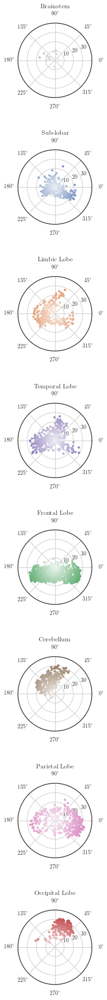

In [48]:
sns_lobe_colors = sns.color_palette(n_colors=len(row_order))  # get default color palette values

f = plt.figure(figsize=(set_size(width, subplots=(len(row_order), 1))))

polar_facet_plot(f, df=polar_df, kind='distance', row_order=row_order, 
                 lobe_colors=sns_lobe_colors, lut=lut)

f.subplots_adjust(hspace=0.7)
f.savefig(f'{path}/figures/2514-isomap-2d-polar-distance-gradient-cmap.png', dpi=300, 
          bbox_inches='tight')
f.savefig(f'{path}/figures/2514-isomap-2d-polar-distance-gradient-cmap.svg', dpi=300, 
          bbox_inches='tight')

## MMD modularity plots

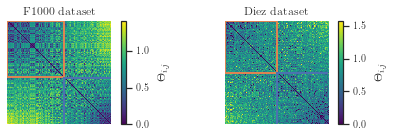

In [49]:
f, ax = plt.subplots(1, 2, figsize=set_size(width, subplots=(1, 2)))

def plot_sort_mats(embedding, ax):
    qsort_idx = np.argsort(embedding.qmax)

    im = ax.imshow(embedding.theta[np.ix_(qsort_idx, qsort_idx)], cmap='viridis')
    cbar = f.colorbar(im, ax=ax)
    cbar.set_label('$\\Theta_{i,j}$', labelpad=10)

    qsort = np.sort(embedding.qmax).copy()
    qsort_mask = (qsort >= 0)

    # Grid communities
    bounds, ixes = bct.grid_communities(qsort_mask)
    rect0 = patches.Rectangle((0, 0), width=np.floor(bounds[0]), height=np.floor(bounds[0]),
                             fill=False, color='C1', linewidth=2)

    rect1 = patches.Rectangle((np.ceil(bounds[0]), np.ceil(bounds[0])), 
                               width=np.ceil(bounds[0]), height=np.ceil(bounds[0]),
                              fill=False, color='C0', linewidth=2)

    ax.add_patch(rect0)
    ax.add_patch(rect1)




    ax.set(xticks=[], yticks=[], xticklabels=[], yticklabels=[])
    sns.despine(left=True, bottom=True)
    
    return ax

plot_sort_mats(f1000, ax=ax[0])
plot_sort_mats(h2514, ax=ax[1])

ax[0].set_title('F1000 dataset', fontsize=12)
ax[1].set_title('Diez dataset', fontsize=12)

f.tight_layout()
f.savefig(f'{path}/figures/theta-sorted-by-q.png', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/theta-sorted-by-q.pdf', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/theta-sorted-by-q.svg', dpi=300, bbox_inches='tight')

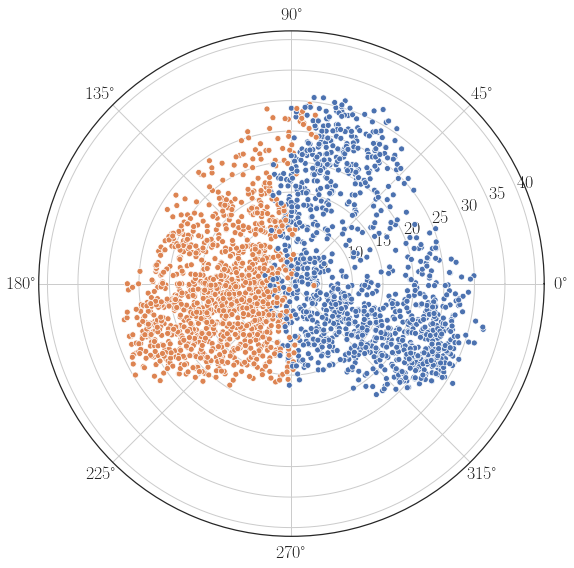

In [50]:
# Plot by MMD modularity
f = plt.figure(figsize=(8, 8))
ax = f.add_subplot(projection='polar')
g = sns.scatterplot(x=theta, y=r, ax=ax, hue=h2514.mod.astype(int), 
                    legend=False)
ax.tick_params(labelsize=18, axis='both')

# Move legend outside of plot
# h, l = ax.get_legend_handles_labels()  # remove automatic legend title
# ax.legend(h[1:], l[1:], title='Lobe', loc='center left', bbox_to_anchor=(-0.4,  0.5), 
#           borderaxespad=0.)
f.tight_layout()
f.savefig(f'{path}/figures/2514-isomap-2d-polar-all-by-module.pdf', dpi=300)
f.savefig(f'{path}/figures/2514-isomap-2d-polar-all-by-module.png', dpi=300)
f.savefig(f'{path}/figures/2514-isomap-2d-polar-all-by-module.svg', dpi=300)

Original version of facet plot with discrete colors by module and universal alpha value

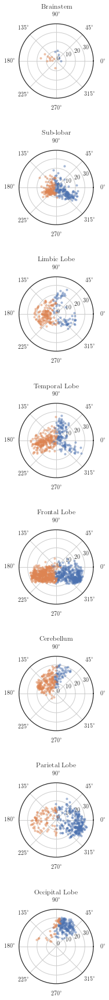

In [51]:
# Build grid and plot
g = sns.FacetGrid(polar_df, row='lobe', hue='mod', subplot_kws={'projection': 'polar'}, 
                  sharex=True, sharey=True, despine=False, row_order=row_order)
g.map(plt.scatter, 'theta', 'r', alpha=0.4, s=10, cmap='tab10')

# Set labels
g.set_titles('{row_name}', pad=20) 
g.set_xlabels('')
g.set_ylabels('')

# Show all ticklabels with shared axes
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True, labelleft=True)
    
# Adjust spacing between rows
g.fig.subplots_adjust(hspace=0.7)

g.savefig(f'{path}/figures/2514-isomap-2d-polar-by-module.pdf', dpi=300)
g.savefig(f'{path}/figures/2514-isomap-2d-polar-by-module.png', dpi=300)
g.savefig(f'{path}/figures/2514-isomap-2d-polar-by-module.svg', dpi=300)

Same data as above, but where alpha is determined by magnitude of corresponding index of top eigenvector $\mathbf{q}$ from $\tilde{\mathbf{K}}$.

In [58]:
# Build colormap with alpha
mmd_colors = create_node_colors(h2514.mod.astype(int))
mmd_rgba = np.zeros([len(polar_df['lobe']), 4])
mmd_rgba[:, :3] = mmd_colors[polar_df['mod']]
mmd_rgba[:, 3] = normalize(h2514.qmax)

In [59]:
sns.color_palette(n_colors=2).as_hex()  # get hex codes to convert to husl degrees

['#4c72b0', '#dd8452']

In [60]:
# Custom blue-orange diverging colormap, seaborn method
BuOr = sns.diverging_palette(217, 22, n=100, center='light', as_cmap=True)

In [61]:
# Custom blue-orange diverging colormap, pure matplotlib method
sns_blue, sns_orange = sns.color_palette(n_colors=2)
sns_white = (244/255, 244/255, 244/255)
BuOr_sns_colors = [sns_blue, sns_white, sns_orange]
BuOr_mpl_colors = [mmd_colors[0], sns_white, mmd_colors[1]]  # from tab10 palette
bins = 100
BuOr_mpl = matplotlib.colors.LinearSegmentedColormap.from_list('BuOr', BuOr_mpl_colors, N=bins)

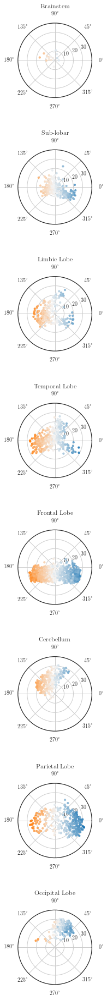

In [62]:
f = plt.figure(figsize=(set_size(width, subplots=(len(row_order), 1))))

polar_facet_plot(f, df=polar_df, kind='mmd', row_order=row_order)

f.subplots_adjust(hspace=0.7) # adjust spacing between rows
f.savefig(f'{path}/figures/2514-isomap-mmd-qvalue-gradient-colormap.png', dpi=300, 
          bbox_inches='tight')
f.savefig(f'{path}/figures/2514-isomap-mmd-qvalue-gradient-colormap.svg', dpi=300, 
          bbox_inches='tight')

Plot colormap to go with plots separately

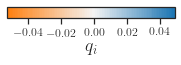

In [63]:
norm = matplotlib.colors.DivergingNorm(vmin=min(h2514.qmax), vcenter=0, vmax=max(h2514.qmax))

f, ax = plt.subplots(figsize=(3, 0.2))
cbar = matplotlib.colorbar.ColorbarBase(ax, cmap=BuOr_mpl, norm=norm, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xlabel('$q_{i}$', fontsize=18)

f.savefig(f'{path}/figures/mmd-gradient-colorbar.svg', bbox_inches='tight')

## Plot distance to origin for each lobe

In [64]:
# medians.reset_index()
polar_medians = (polar_df[['lobe', 'r']]
                 .groupby('lobe')
                 .median()
                 .sort_values('r')
                 .reset_index())
polar_medians

,lobe,r
0,Brainstem,6.907536
1,Sub-lobar,8.530119
2,Limbic Lobe,12.826863
3,Temporal Lobe,13.314003
4,Frontal Lobe,16.728295
5,Cerebellum,17.199769
6,Parietal Lobe,20.922787
7,Occipital Lobe,24.038904


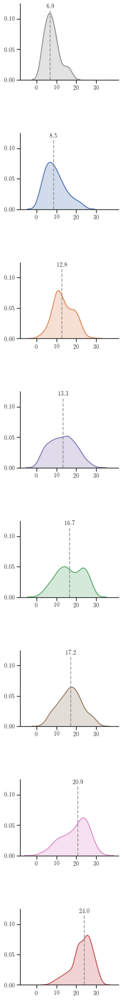

In [65]:
df = pd.DataFrame({'theta': theta,
                   'r': r,
                   'mod': h2514.mod.astype(int),
                   'lobe': h2514_dist_df['lobe'],
                   'roi': h2514_dist_df['roi']})

row_order = ('Brainstem', 'Sub-lobar', 'Limbic Lobe', 'Temporal Lobe', 'Frontal Lobe',
             'Cerebellum', 'Parietal Lobe', 'Occipital Lobe')

g = sns.FacetGrid(df, row='lobe', hue='lobe', row_order=row_order)  # polar coordinates radius
g.map(sns.kdeplot, 'r', shade=True)

# Axis labels
g.set_titles('')
g.set_xlabels('')
g.set_ylabels('')

# Axis ticks
for i, ax in enumerate(g.axes.flatten()):
    ax.tick_params(labelbottom=True, labelleft=True)  # show tick labels for all subplots
    ax.set_xticks(np.arange(0, 40, 10))
    ax.set_ylim(0, 0.125)
    ax.set_yticks([0, 0.05, 0.1])
    
    # Add median reference line and value
    ax.axvline(x=polar_medians['r'][i], 
               color='gray', 
               alpha=0.75, 
               linestyle='--',
               ymax=0.92)
    
    ax.annotate(str(np.round(polar_medians['r'][i], 1)),
                xy=(polar_medians['r'][i], 0.118),
                ha='center')
    
g.fig.subplots_adjust(hspace=0.7)  # increase space between rows
g.savefig(f'{path}/figures/2514-distance-to-origin-by-lobe-kdeplot.svg', dpi=300)

Create facet grid of polar plots and KDE plots

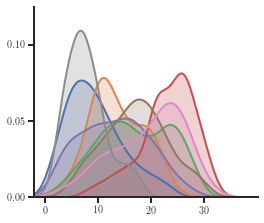

In [66]:
f, ax = plt.subplots(figsize=(4, 3.5))
for i, lobe in enumerate(lobes):
    sns.kdeplot(data=df.loc[df['lobe'] == lobe, 'r'], 
                shade=True, ax=ax, legend=None, linewidth=2)
    
# Plot aesthetics
ax.tick_params(labelbottom=True, labelleft=True, width=2)  # show all tick labels
ax.set_xlim(-2, 40),
ax.set_xticks(np.arange(0, 35, 10))
ax.set_ylim(0, 0.125)
ax.set_yticks([0, 0.05, 0.1])
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

f.savefig(f'{path}/figures/2514-distance-to-origin-kdeplot.svg', dpi=300)

## Plot glass brain colored by anatomical lobes.

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:1766: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if node_color == 'auto':
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.901382345271923. But, you have given threshold=1 
  threshold))


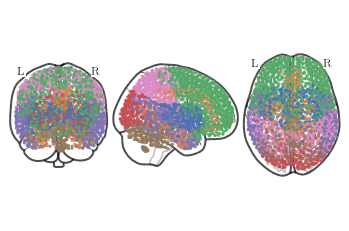

In [67]:
# Plot aesthetics
s = [20, 5]
alpha = 0.75
edge_threshold = 1  # hack to turn off edges

# Map distinct colors to each lobe
cmap = create_N_colors(len(lobes), sns.color_palette())
node_colors = dict(zip(lobes, np.arange(len(lobes))))
color_lut = h2514_dist_df['lobe'].map(node_colors).to_numpy()
colors = cmap[color_lut]

# 2514 ROI plot
f, ax = plt.subplots()
plot_connectome(h2514.avg_nw, node_coords=h2514.roi_xyz, node_size=5, 
                node_color=colors, colorbar=False, edge_threshold=1, 
                node_kwargs={'alpha': alpha}, axes=ax)

f.savefig(f'{path}/figures/2514-glass-brain-color-by-lobe.svg', dpi=300, bbox_inches='tight')

Same data as above, but using colormap gradient for each lobe color

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.6176643780292465. But, you have given threshold=1 
  threshold))
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:1097: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  .3 * (x1 - x0), y1 - y0], aspect='equal')
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.8381502959942528. But, you have given threshold=1 
  threshold))
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exce

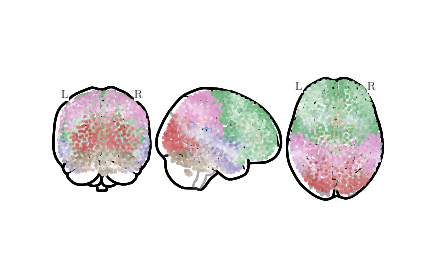

In [68]:
f, ax = plt.subplots()

for i, lobe in enumerate(row_order):
    # Generate lobe data
    lobe_df = h2514_dist_df.loc[h2514_dist_df['lobe'] == lobe]
    lobe_xyz = lobe_df[['x', 'y', 'z']].to_numpy()
    lobe_nw = h2514.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
    color = polar_df.loc[polar_df['lobe'] == lobe, 'r'].to_numpy()
    lobe_cmap = sns.light_palette(sns_lobe_colors[lut[lobe]], n_colors=50, as_cmap=True)
    
    # Build plot
    plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=5,
                   node_color=color, colorbar=False, edge_threshold=1,
                   node_kwargs={'cmap': lobe_cmap, 'vmin': 0, 'vmax': polar_df['r'].max()}, 
                    axes=ax)
    
f.tight_layout()
# f.savefig(f'{path}/figures/2514-glass-brain-color-by-lobe-distance-gradient-cmap.png',
#           dpi=300,
#           bbox_inches='tight')
# f.savefig(f'{path}/figures/2514-glass-brain-color-by-lobe-distance-gradient-cmap.svg',
#           dpi=300,
#           bbox_inches='tight')

Original version of facet plot, with discrete colors and universal alpha value.

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

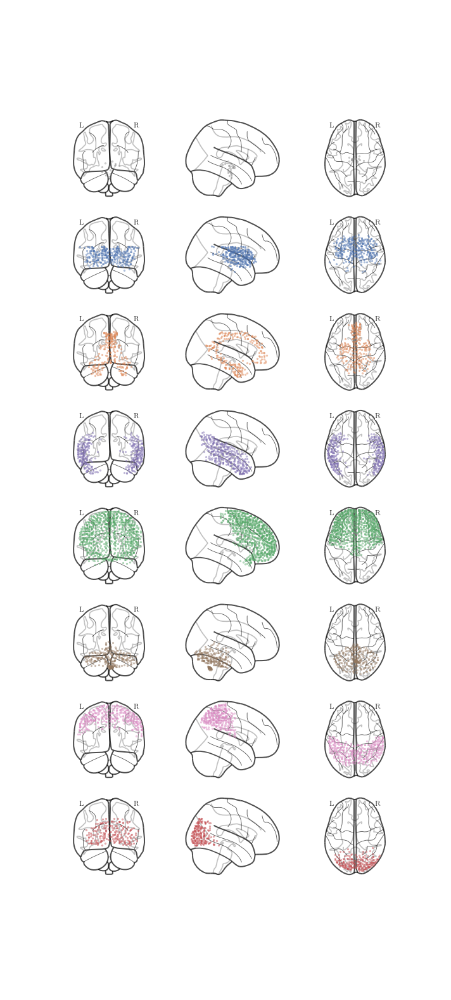

In [69]:
# Facet glass brain by lobe
f, ax = plt.subplots(nrows=len(lobes), figsize=(10, 22))

for i, lobe in enumerate(row_order):
    # Generate lobe data
    lobe_df = h2514_dist_df.loc[h2514_dist_df['lobe'] == lobe]
    lobe_xyz = lobe_df[['x', 'y', 'z']].to_numpy()
    lobe_nw = h2514.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
    lobe_color = cmap[node_colors[lobe]]
    
    # Build plot
    plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=5,
                   node_color=lobe_color, colorbar=False, edge_threshold=1,
                   node_kwargs={'alpha': 0.4}, axes=ax[i])
    
f.tight_layout()
f.savefig(f'{path}/figures/2514-glass-brain-color-by-lobe-facet.svg',
          dpi=300,
          bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


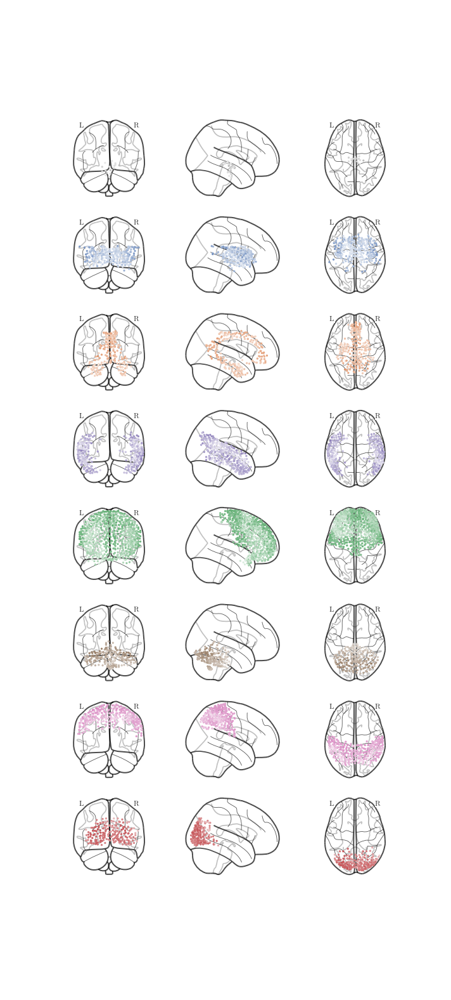

In [70]:
# Facet glass brain by lobe
f, ax = plt.subplots(nrows=len(lobes), figsize=(10, 22))

for i, lobe in enumerate(row_order):
    # Generate lobe data
    lobe_df = h2514_dist_df.loc[h2514_dist_df['lobe'] == lobe]
    lobe_xyz = lobe_df[['x', 'y', 'z']].to_numpy()
    lobe_nw = h2514.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
    color = polar_df.loc[polar_df['lobe'] == lobe, 'r'].to_numpy()
    lobe_cmap = sns.light_palette(sns_lobe_colors[lut[lobe]], n_colors=50, as_cmap=True)
    
    # Build plot
    plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=5,
                   node_color=color, colorbar=False, edge_threshold=1,
                   node_kwargs={'cmap': lobe_cmap, 'vmin': 0, 'vmax':polar_df['r'].max()}, 
                    axes=ax[i])
    
f.tight_layout()
f.savefig(f'{path}/figures/2514-glass-brain-color-by-lobe-facet-distance-gradient-cmap.png',
          dpi=300,
          bbox_inches='tight')
f.savefig(f'{path}/figures/2514-glass-brain-color-by-lobe-facet-distance-gradient-cmap.svg',
          dpi=300,
          bbox_inches='tight')

## Glass brain colored by MMD modularity

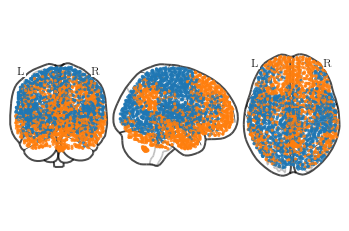

In [71]:
# Plot aesthetics
s = [20, 5]
alpha = 0.75
edge_threshold = 1  # hack to turn off edges

# Map distinct colors to each lobe
mmd_colors = create_node_colors(h2514.mod.astype(int))

f, ax = plt.subplots()

# 2514 ROI plot
plot_connectome(h2514.avg_nw, node_coords=h2514.roi_xyz, node_size=5, 
                node_color=mmd_colors, colorbar=False, edge_threshold=1, 
                node_kwargs={'alpha': alpha}, axes=ax)

f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd.svg', dpi=300, bbox_inches='tight')

Same plot as above with colormap gradient mapped to $\mathbf{q}$.

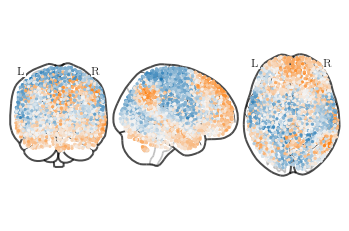

In [72]:
# Center blue-orange values at zero
offset = matplotlib.colors.DivergingNorm(vmin=h2514.qmax.min(),
                                         vcenter=0,
                                         vmax=h2514.qmax.max())

# Plot aesthetics
s = [20, 5]
edge_threshold = 1  # turn off edges

f, ax = plt.subplots()

plot_connectome(h2514.avg_nw, node_coords=h2514.roi_xyz, node_size=5,
                node_color=h2514.qmax, colorbar=False, edge_threshold=1,
                node_kwargs={'cmap': BuOr_mpl,
                             'norm': offset,
                             'vmin': min(h2514.qmax),
                             'vmax': max(h2514.qmax)}, 
                axes=ax)

f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-gradient.svg', 
          dpi=300, bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  app.launch_new_instance()


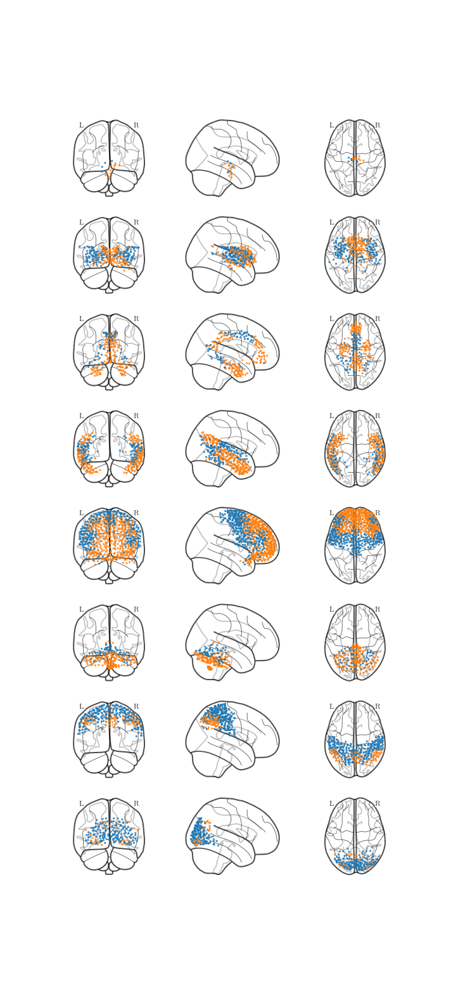

In [73]:
# Plot brain regions by MMD modularity
f, ax = plt.subplots(nrows=len(lobes), figsize=(10, 22))

for i, lobe in enumerate(row_order):
    # Generate lobe data
    lobe_df = h2514_dist_df.loc[h2514_dist_df['lobe'] == lobe]
    lobe_xyz = lobe_df[['x', 'y', 'z']].to_numpy()
    lobe_nw = h2514.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
    lobe_color = mmd_colors[lobe_df.index]
    
    # Build plot
    plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=5,
                   node_color=lobe_color, colorbar=False, edge_threshold=1,
                   node_kwargs={'alpha': 0.75}, axes=ax[i])
    
f.tight_layout()
f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet.svg',
          dpi=300,
          bbox_inches='tight')

Same data as above, but using the normalized $\mathbf{q}$ values from $\tilde{\mathbf{K}}$ as the color values.

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


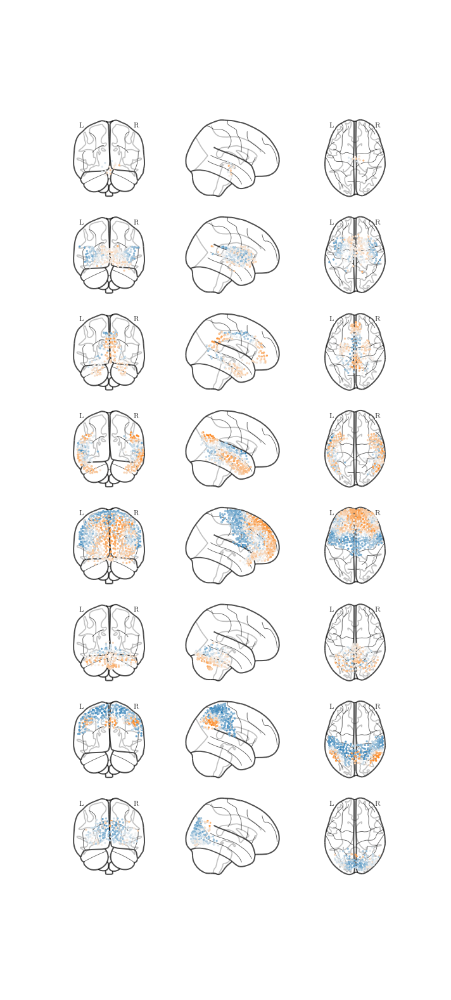

In [74]:
# Center blue-orange values at zero
offset = matplotlib.colors.DivergingNorm(vmin=h2514.qmax.min(),
                                         vcenter=0,
                                         vmax=h2514.qmax.max())

f, ax = plt.subplots(nrows=len(lobes), figsize=(10, 22))

for i, lobe in enumerate(row_order):
    # Generate lobe data
    lobe_df = h2514_dist_df.loc[h2514_dist_df['lobe'] == lobe]
    lobe_xyz = lobe_df[['x', 'y', 'z']].to_numpy()
    lobe_nw = h2514.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
    
    # Build plot
    plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=5,
                    node_color=h2514.qmax[lobe_df.index], colorbar=False, edge_threshold=1,
                    node_kwargs={'cmap': BuOr_mpl,
                                 'norm': offset,
                                 'vmin': min(h2514.qmax),
                                 'vmax': max(h2514.qmax)}, 
                    axes=ax[i])
    
f.tight_layout()
f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-qvalue-gradient.png',
          dpi=300,
          bbox_inches='tight')
f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-qvalue-gradient.svg',
          dpi=300,
          bbox_inches='tight')

## Second and third eigenvector glass brain plots

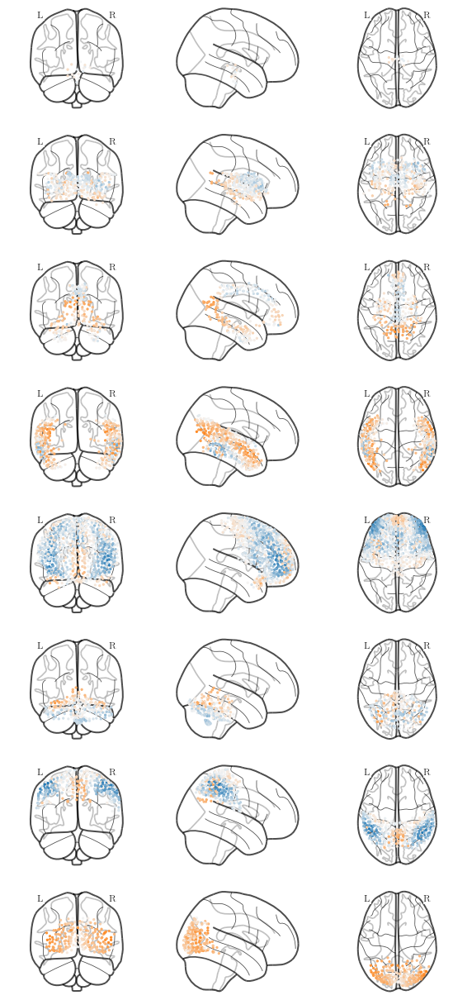

In [75]:
# Test using the second eigenvector to map color
# Center blue-orange values at zero
q2 = h_evecs[:, 1] # #2 top eigenvector
q3 = h_evecs[:, 2]  # #3 top eigenvector

q = q2

offset2 = matplotlib.colors.DivergingNorm(vmin=q.min(),
                                          vcenter=0,
                                          vmax=q.max())

f, ax = plt.subplots(nrows=len(lobes), figsize=(10, 22))

for i, lobe in enumerate(row_order):
    # Generate lobe data
    lobe_df = h2514_dist_df.loc[h2514_dist_df['lobe'] == lobe]
    lobe_xyz = lobe_df[['x', 'y', 'z']].to_numpy()
    lobe_nw = h2514.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
    
    # Build plot
    plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=5,
                    node_color=q[lobe_df.index], colorbar=False, edge_threshold=1,
                    node_kwargs={'cmap': BuOr_mpl,
                                 'norm': offset,
                                 'vmin': q.min(),
                                 'vmax': q.max()}, 
                    axes=ax[i])
    
f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-q2value-gradient.png',
          dpi=300,
          bbox_inches='tight')
# f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-qvalue-gradient.svg',
#           dpi=300,
#           bbox_inches='tight')

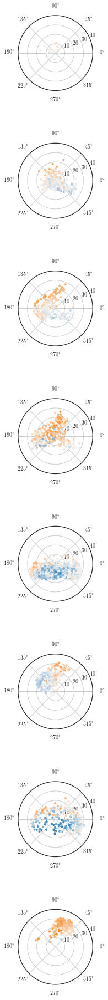

In [76]:
q2 = h_evecs[:, 1] # #2 top eigenvector
q3 = h_evecs[:, 2]  # #3 top eigenvector

q = q2

offset2 = matplotlib.colors.DivergingNorm(vmin=q.min(),
                                          vcenter=0,
                                          vmax=q.max())

f = plt.figure(figsize=(set_size(width, subplots=(len(row_order), 1))))

for i, lobe in enumerate(row_order):
    lobe_df = polar_df.loc[polar_df['lobe'] == lobe]
    ax = f.add_subplot(len(row_order), 1, i+1, projection='polar')

    im = ax.scatter(lobe_df['theta'], lobe_df['r'], s=10, 
                    c=q[lobe_df.index], cmap=BuOr_mpl,
                    norm=offset2,
                    vmin=q.min(), vmax=q.max())
    
    ax.set_ylim(0, 40)
    
f.subplots_adjust(hspace=0.7) # adjust spacing between rows
f.savefig(f'{path}/figures/2514-isomap-mmd-q2value-gradient-colormap.png', dpi=300)
f.savefig(f'{path}/figures/2514-isomap-mmd-q2value-gradient-colormap.svg', dpi=300)

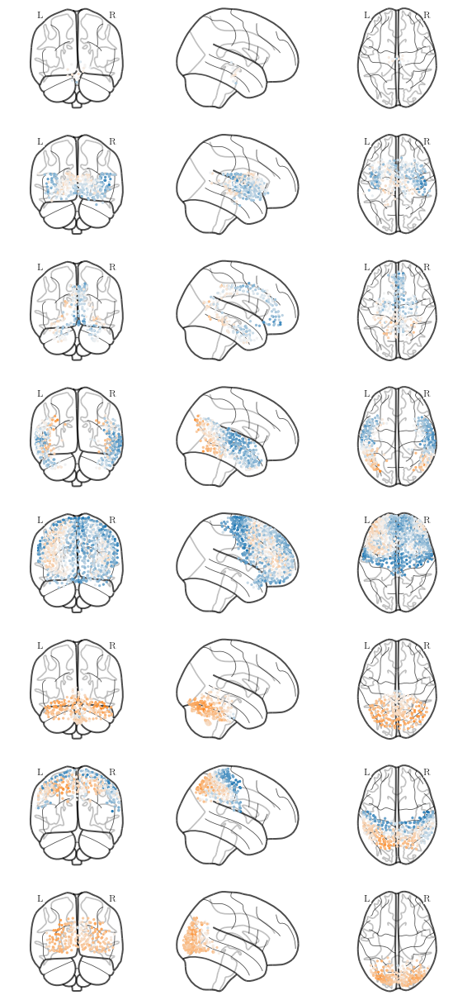

In [77]:
# Test using the third eigenvector to map color
q3 = h_evecs[:, 2]  # #3 top eigenvector

q = q3

# Center blue-orange values at zero
offset2 = matplotlib.colors.DivergingNorm(vmin=q.min(),
                                          vcenter=0,
                                          vmax=q.max())

f, ax = plt.subplots(nrows=len(lobes), figsize=(10, 22))

for i, lobe in enumerate(row_order):
    # Generate lobe data
    lobe_df = h2514_dist_df.loc[h2514_dist_df['lobe'] == lobe]
    lobe_xyz = lobe_df[['x', 'y', 'z']].to_numpy()
    lobe_nw = h2514.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
    
    # Build plot
    plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=5,
                    node_color=q[lobe_df.index], colorbar=False, edge_threshold=1,
                    node_kwargs={'cmap': BuOr_mpl,
                                 'norm': offset,
                                 'vmin': q.min(),
                                 'vmax': q.max()}, 
                    axes=ax[i])
    
f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-q3value-gradient.png',
          dpi=300,
          bbox_inches='tight')
# f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-qvalue-gradient.svg',
#           dpi=300,
#           bbox_inches='tight')

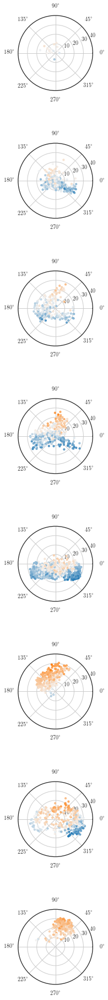

In [78]:
q3 = h_evecs[:, 2]  # #3 top eigenvector

q = q3

offset2 = matplotlib.colors.DivergingNorm(vmin=q.min(),
                                          vcenter=0,
                                          vmax=q.max())

f = plt.figure(figsize=(set_size(width, subplots=(len(row_order), 1))))

for i, lobe in enumerate(row_order):
    lobe_df = polar_df.loc[polar_df['lobe'] == lobe]
    ax = f.add_subplot(len(row_order), 1, i+1, projection='polar')

    im = ax.scatter(lobe_df['theta'], lobe_df['r'], s=10, 
                    c=q[lobe_df.index], cmap=BuOr_mpl,
                    norm=offset2,
                    vmin=q.min(), vmax=q.max())
    
    ax.set_ylim(0, 40)
    
f.subplots_adjust(hspace=0.7) # adjust spacing between rows
f.savefig(f'{path}/figures/2514-isomap-mmd-q3value-gradient-colormap.png', dpi=300)
f.savefig(f'{path}/figures/2514-isomap-mmd-q3value-gradient-colormap.svg', dpi=300)

## Get number of regions within each module

In [79]:
counts = ((h2514_dist_df.copy()
          .groupby(['lobe', 'mod'], as_index=False)
          .agg(['count']))['roi']
          .reset_index())

counts['mod'] = counts['mod'].astype('category')
counts['lobe'] = pd.Categorical(counts['lobe'], 
                                categories=reversed(list(row_order)), 
                                ordered=True)
counts

,lobe,mod,count
0,Brainstem,0,5
1,Brainstem,1,11
2,Cerebellum,0,69
3,Cerebellum,1,189
4,Frontal Lobe,0,371
5,Frontal Lobe,1,438
6,Limbic Lobe,0,70
7,Limbic Lobe,1,150
8,Occipital Lobe,0,171
9,Occipital Lobe,1,34


In [80]:
counts2 = counts.set_index('lobe').pivot(columns='mod', values='count')
counts2

mod,0,1
lobe,,
Occipital Lobe,171,34
Parietal Lobe,256,87
Cerebellum,69,189
Frontal Lobe,371,438
Temporal Lobe,136,233
Limbic Lobe,70,150
Sub-lobar,165,129
Brainstem,5,11


In [81]:
# Percent counts
mod0 = counts2.iloc[:, 0].reset_index(drop=True)
mod1 = counts2.iloc[:, 1].reset_index(drop=True)

percs = pd.DataFrame({'lobe': pd.Series(reversed(row_order)),
                               'mod0': mod0, 
                               'mod1': mod1})

percs['per0'] = (percs['mod0'] / (percs['mod0'] + percs['mod1'])) * 100
percs['per1'] = 100 - percs['per0']

percs = percs[['lobe', 'per0', 'per1']].set_index('lobe')
percs

,per0,per1
lobe,,
Occipital Lobe,83.414634,16.585366
Parietal Lobe,74.635569,25.364431
Cerebellum,26.744186,73.255814
Frontal Lobe,45.859085,54.140915
Temporal Lobe,36.856369,63.143631
Limbic Lobe,31.818182,68.181818
Sub-lobar,56.122449,43.877551
Brainstem,31.250000,68.750000


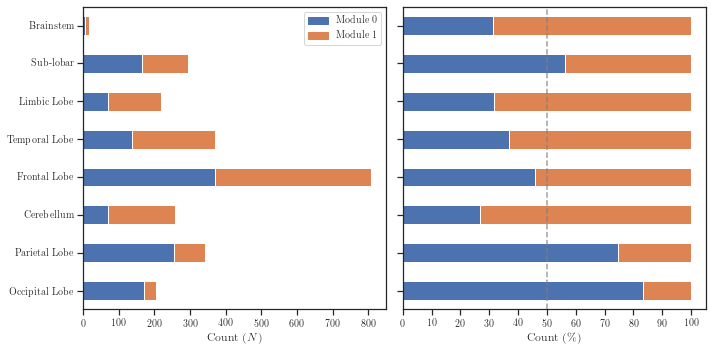

In [82]:
# Build plot
colors = create_N_colors(2, palette=sns.color_palette())

f, ax = plt.subplots(ncols=2, figsize=(10, 6))
counts2.plot(kind='barh', stacked=True, ax=ax[0], color=colors)
percs.plot(kind='barh', stacked=True, ax=ax[1], color=colors)

# Plot aesthetics
ax[0].set_aspect(square_ax(ax[0]))
ax[0].get_legend().remove()
ax[0].set_ylabel('')
ax[0].set_xlabel('Count ($N$)')

ax[1].axvline(x=50, color='gray', linestyle='--', alpha=0.75)
ax[1].set_aspect(square_ax(ax[1]))
ax[1].get_legend().remove()
ax[1].set_xticks(np.arange(101, step=10))
ax[1].set_xticklabels(np.arange(101, step=10))
ax[1].set_yticklabels([])
ax[1].set_ylabel('')
ax[1].set_xlabel('Count (\\%)')

# Custom legend
blue_bar = matplotlib.patches.Patch(color=colors[0], label='Module 0')
orange_bar = matplotlib.patches.Patch(color=colors[1], label='Module 1')

ax[0].legend(handles=[blue_bar, orange_bar], loc='upper right')

f.tight_layout()
f.savefig(f'{path}/figures/count-and-percentages-by-module.png', dpi=300)
f.savefig(f'{path}/figures/count-and-percentages-by-module.svg', dpi=300)

In [83]:
all_counts = h2514_dist_df.groupby('mod').agg('count').reset_index()[['mod', 'roi']]
all_counts

,mod,roi
0,0,1243
1,1,1271


In [84]:
percs_all = np.array([1243/2514, 1271/2514]) * 100
percs_all_df = pd.DataFrame({'perc': percs_all, 'mod': ['0', '1']})
percs_all_df

,perc,mod
0,49.443119,0
1,50.556881,1


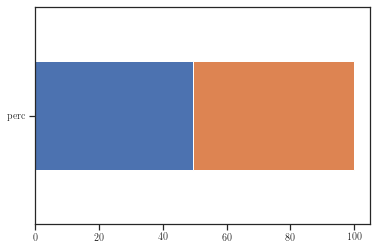

In [85]:
f, ax = plt.subplots()
percs_all_df.set_index('mod').T.plot(kind='barh', stacked=True, ax=ax)
ax.get_legend().remove()
ax.set_ylabel('')
f.savefig(f'{path}/figures/percent-by-module.svg', dpi=300)

## Gradient distances from sample node
- Choose node of interest (e.g., hippocampus)
- Compute and rank Euclidean distance to that node and all other nodes
- Take top N (e.g., 20, 50, 100)
- Map to color
- Plot isomap embedding and glass brain with those colors

In [86]:
df = (polar_df
      .copy()
      .assign(roi=h2514_dist_df['roi'])
      .drop(columns='lut'))

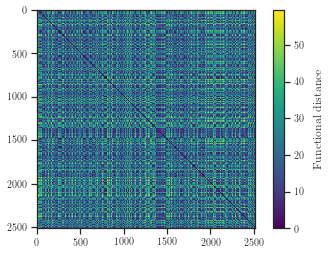

In [87]:
# All isomap pairwise distances
isomap_D = edist(iso_xyz[:, :2])

f, ax = plt.subplots(figsize=set_size(width))
im = ax.imshow(isomap_D, cmap='viridis')
cbar = f.colorbar(im, ax=ax)
cbar.set_label('Functional distance', fontsize=12, labelpad=10)

f.savefig(f'{path}/figures/pairwise-embedding-distance-heatmap.pdf', 
          dpi=300, bbox_inches='tight')

In [88]:
src_dist = df.copy()
src_dist['x'] = iso_xyz[:, 0]
src_dist['y'] = iso_xyz[:, 1]
src_dist['hemi'] = h2514_dist_df['hemi']
src_dist['roitex'] = src_dist['roi'].replace('_', ' ', regex=True)  # remove _ for LaTeX plots
src_dist

,theta,r,lobe,mod,roi,x,y,hemi,roitex
0,-0.658249,17.820937,Sub-lobar,0,Heschl,14.097507,-10.901656,R,Heschl
1,3.098933,8.952467,Limbic Lobe,1,ParaHippocampal,-8.944323,0.381790,R,ParaHippocampal
2,-0.496311,25.818970,Frontal Lobe,0,Precentral,22.703790,-12.294598,L,Precentral
3,1.041876,20.740034,Occipital Lobe,0,Cuneus,10.465452,17.905958,L,Cuneus
4,-1.797318,9.813059,Frontal Lobe,0,Frontal_Mid_Orb,-2.203909,-9.562370,L,Frontal Mid Orb
5,1.457636,25.603908,Occipital Lobe,1,Occipital_Inf,2.891156,25.440152,R,Occipital Inf
6,-0.458061,25.960444,Frontal Lobe,0,Supp_Motor_Area,23.284225,-11.479963,R,Supp Motor Area
7,-0.283352,0.621636,Sub-lobar,0,Thalamus,0.596847,-0.173794,L,Thalamus
8,-2.437032,13.545573,Temporal Lobe,1,Temporal_Mid,-10.320321,-8.773456,L,Temporal Mid
9,2.854646,18.454566,Cerebellum,1,Cerebellum,-17.700004,5.223107,R,Cerebellum


Get mean hemisphere hippocampus coordinates in isomap embedding.

In [89]:
def mean_src_dist(df, src_name, lookup_in='roi'):
    """Compute the Euclidean distance to the mean coordinate
    of ROI or lobe in the isomap embedding.
    
    Parameters
    ----------
    df : pandas dataframe
        Dataframe containing the Cartesian and polar 2D coordinates
        for N regions, region names, and lobe names. 
        
    src_name : string
        Name of region or lobe to compute distance to.
        
    lookup_in : string ('roi' or 'lobe')
        Choose whether src_name is in the 'roi' or 'lobe' column.
        
    Returns
    -------
    dist_to_src : numpy vector
        Vector of distances to mean src_name coordinate.
    """
    
    src_xy = (df
              .loc[df[lookup_in] == src_name, ['x', 'y']]
              .mean(axis=0)
              .to_numpy()
              .reshape(1, 2))

    dist_to_src = edist(df[['x', 'y']].to_numpy(), src_xy)
    
    return dist_to_src

In [90]:
src_dist['hippo-dist'] = mean_src_dist(src_dist, 'Hippocampus')

In [91]:
closest_to_src = src_dist.sort_values('hippo-dist').head(n=100)
closest_to_src

,theta,r,lobe,mod,roi,x,y,hemi,roitex,hippo-dist
2192,2.250321,7.907687,Cerebellum,1,Vermis,-4.969375,6.151165,None,Vermis,0.126686
88,2.260166,8.288287,Sub-lobar,1,Hippocampus,-5.271770,6.395635,R,Hippocampus,0.322755
1939,2.297370,7.621297,Sub-lobar,1,Hippocampus,-5.062923,5.696576,R,Hippocampus,0.431010
1883,2.183632,7.669611,Cerebellum,1,Cerebellum,-4.411480,6.273896,R,Cerebellum,0.697899
1096,2.205841,7.419221,Cerebellum,1,Vermis,-4.401179,5.972810,None,Vermis,0.709304
2344,2.347345,8.455105,Limbic Lobe,1,Fusiform,-5.925523,6.031333,L,Fusiform,0.837313
2404,2.379493,8.199067,Cerebellum,1,Cerebellum,-5.931106,5.660979,R,Cerebellum,0.958155
2359,2.371151,7.462002,Temporal Lobe,1,Temporal_Mid,-5.354755,5.196929,L,Temporal Mid,0.965541
277,2.253871,6.958542,Sub-lobar,1,Thalamus,-4.392096,5.397296,L,Thalamus,1.011870
586,2.363680,8.570627,Parietal Lobe,1,Precuneus,-6.105542,6.014816,R,Precuneus,1.018051


Visualize with color scale

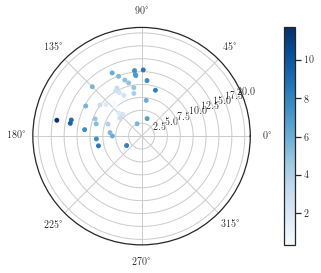

In [92]:
f = plt.figure()
ax = f.add_subplot(projection='polar')
im = ax.scatter(x=src_dist.loc[src_dist['roi'] == 'Hippocampus', 'theta'], 
                y=src_dist.loc[src_dist['roi'] == 'Hippocampus', 'r'], 
                c=src_dist.loc[src_dist['roi'] == 'Hippocampus', 'hippo-dist'], 
                s=15,
                cmap='Blues')

f.colorbar(im, ax=ax, pad=0.1)

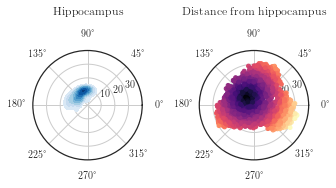

In [93]:
width_in, height_in = set_size(345, subplots=(1, 2))
f = plt.figure(figsize=(width_in, 3))
ax0 = f.add_subplot(121, projection='polar')

# Hippocampus kdeplot
sns.kdeplot(src_dist.loc[src_dist['roi'] == 'Hippocampus', 'theta'],
            src_dist.loc[src_dist['roi'] == 'Hippocampus', 'r'],
            cmap='Blues', shade=True, shade_lowest=False, ax=ax0)

ax0.set_ylim(0, 40)
ax0.set_yticks(np.arange(10, 40, step=10))
ax0.set_yticklabels([10, 20, 30])
ax0.set_xlabel('')
ax0.set_ylabel('')
ax0.set_title('Hippocampus', pad=30)
ax0.set_aspect('equal')

# Distance from hippocampus
ax1 = f.add_subplot(122, projection='polar')

im = ax1.scatter(x=src_dist['theta'], y=src_dist['r'], s=15,
                c=src_dist['hippo-dist'], cmap='magma')

ax1.set_aspect('equal')
ax1.set_title('Distance from hippocampus', pad=30)
ax1.set_ylim(0, 40)
ax1.set_yticks(np.arange(10, 40, step=10))
ax1.set_yticklabels([10, 20, 30])

f.tight_layout()

f.savefig(f'{path}/figures/isomap-dist-from-hippo.pdf', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/isomap-dist-from-hippo.svg', dpi=300, bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:1766: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if node_color == 'auto':
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.901382345271923. But, you have given threshold=1 
  threshold))


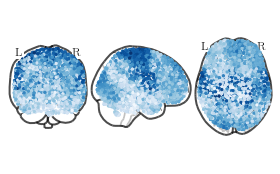

In [94]:
f, ax = plt.subplots(figsize=set_size(345))

plot_connectome(h2514.avg_nw, node_coords=h2514.roi_xyz, node_size=5,
                node_color=src_dist['hippo-dist'].to_numpy(), edge_threshold=1,
               node_kwargs={'cmap': 'Blues'}, axes=ax)

f.savefig(f'{path}/figures/isomap-hippo-dist-glass-brain.png', dpi=300, bbox_inches='tight')

Plot only 100 closest nodes

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.8328431291012416. But, you have given threshold=1 
  threshold))


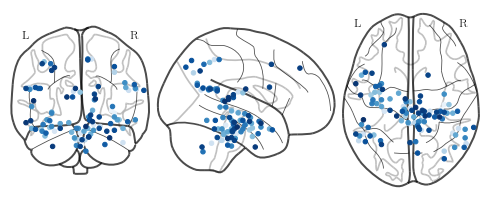

In [95]:
nw = h2514.avg_nw[np.ix_(closest_to_src.index, closest_to_src.index)]
xyz = h2514.roi_xyz.iloc[closest_to_src.index, :]

plot_connectome(nw, node_coords=xyz, node_size=20, 
                node_color=closest_to_src['hippo-dist'].to_numpy(), edge_threshold=1,
                node_kwargs={'cmap': 'Blues'})

plt.savefig(f'{path}/figures/isomap-hippo-dist-glass-brain-100-nodes.png', 
            dpi=300, bbox_inches='tight')

### Occipital lobe

In [96]:
src_dist['occ-dist'] = mean_src_dist(src_dist, 'Occipital Lobe', lookup_in='lobe')

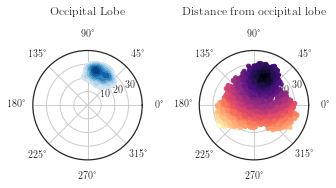

In [97]:
width_in, height_in = set_size(345, subplots=(1, 2))
f = plt.figure(figsize=(width_in, 3))
ax0 = f.add_subplot(121, projection='polar')

# Occipital lobe kdeplot
sns.kdeplot(src_dist.loc[src_dist['lobe'] == 'Occipital Lobe', 'theta'],
            src_dist.loc[src_dist['lobe'] == 'Occipital Lobe', 'r'],
            cmap='Blues', shade=True, shade_lowest=False, ax=ax0)

ax0.set_ylim(0, 40)
ax0.set_yticks(np.arange(10, 40, step=10))
ax0.set_yticklabels([10, 20, 30])
ax0.set_xlabel('')
ax0.set_ylabel('')
ax0.set_title('Occipital Lobe', pad=30)
ax0.set_aspect('equal')

# Distance from occipital lobe
ax1 = f.add_subplot(122, projection='polar')

im = ax1.scatter(x=src_dist['theta'], y=src_dist['r'], s=15,
                 c=src_dist['occ-dist'], cmap='magma')

ax1.set_aspect('equal')
ax1.set_title('Distance from occipital lobe', pad=30)
ax1.set_ylim(0, 40)
ax1.set_yticks(np.arange(10, 40, step=10))
ax1.set_yticklabels([10, 20, 30])

f.tight_layout()

f.savefig(f'{path}/figures/isomap-dist-from-occ.png', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/isomap-dist-from-occ.svg', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/isomap-dist-from-occ.pdf', dpi=300, bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:1766: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if node_color == 'auto':
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.901382345271923. But, you have given threshold=1 
  threshold))
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  # This is added back by InteractiveShellApp.init_path()


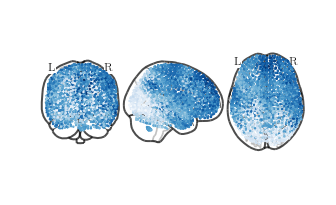

In [98]:
f, ax = plt.subplots(figsize=set_size(345))

plot_connectome(h2514.avg_nw, 
                node_coords=h2514.roi_xyz, 
                node_size=2,
                node_color=src_dist['occ-dist'].to_numpy(), 
                edge_threshold=1,
                node_kwargs={'cmap': 'Blues'},
                axes=ax)

f.tight_layout()

plt.savefig(f'{path}/figures/occdist-anat.png', dpi=300, bbox_inches='tight')

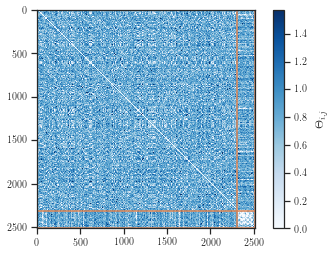

In [99]:
occ_mask = (src_dist['lobe'] == 'Occipital Lobe').to_numpy().astype(int)

bounds, ixes = bct.grid_communities(occ_mask)

f, ax = plt.subplots(figsize=set_size(width))

im = ax.imshow(h2514.theta[np.ix_(ixes, ixes)], cmap='Blues')

for b in bounds:
    ax.axvline(x=b,color='C1')
    ax.axhline(y=b,color='C1')
    
cbar = f.colorbar(im, ax=ax)
cbar.set_label('$\\Theta_{i,j}$', fontsize=12, labelpad=10)

f.savefig(f'{path}/figures/2514-theta-sorted-by-occipital-lobe.pdf', 
          dpi=300, bbox_inches='tight')

### Precuneus

In [100]:
src_dist['precun-dist'] = mean_src_dist(src_dist, 'Precuneus')

(0, 40)

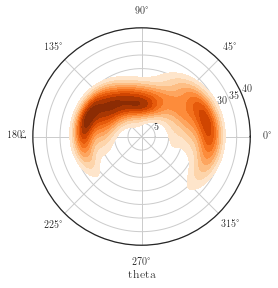

In [101]:
f = plt.figure()
ax = f.add_subplot(projection='polar')

sns.kdeplot(src_dist.loc[src_dist['roi'] == 'Precuneus', 'theta'],
            src_dist.loc[src_dist['roi'] == 'Precuneus', 'r'],
           cmap='Oranges', shade=True, shade_lowest=False)

ax.set_ylim(0, 40)

Occipital lobe vs precuneus

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:1766: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if node_color == 'auto':
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.901382345271923. But, you have given threshold=1 
  threshold))


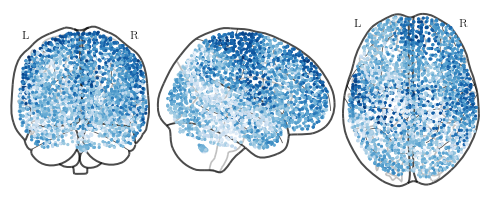

In [102]:
plot_connectome(h2514.avg_nw, node_coords=h2514.roi_xyz, node_size=5,
                node_color=src_dist['precun-dist'].to_numpy(), edge_threshold=1,
               node_kwargs={'cmap': 'Blues'})

## Distance to origin surface maps

def roi_to_vol(xyz, values):
    """Creates 3D volume of ROI points in MNI grid space that
    have associated data values (i.e., each (x,y,z)-coordinate has
    a single value associated with it). The 3D volume is then interpolated
    and a new NIfTI image is created that is registered to the MNI 
    template image. The resulting NIfTI image can then be visualized
    as a cortical surface plot using plotting tools from Nilearn.
    
    Parameters
    ----------
    xyz : numpy array
        Nx4 array containing the MNI (x,y,z)-coordinates for each ROI.
        
    values : numpy vector
        Numpy vector of length N containing the data value associated with
        each ROI.
        
    name : string
        Name of region (used for saving filenames).
        
    Returns
    -------
    grid_val : numpy array
        3D array containing the interpolated ROI data.
    """
    
    def row_isin(row, array):
        """Check if 1xM row is in NxM array."""
        return any(np.array_equal(row, x) for x in array)
    
    """Create 3D volume"""
    # ROI coordinates
    x = xyz[:, 0]
    y = xyz[:, 1]
    z = xyz[:, 2]
    
    # 3D grid point ranges
    X = np.arange(x.min(), x.max()+1)
    Y = np.arange(y.min(), y.max()+1)
    Z = np.arange(z.min(), z.max()+1)

    V = np.zeros([len(X), len(Y), len(Z)])  # 3D volume with ROI data

    # Covnvert (x,y,z) data points to indices of V
    xd = dict(zip(X, np.arange(len(X))))
    yd = dict(zip(Y, np.arange(len(Y))))
    zd = dict(zip(Z, np.arange(len(Z))))

    data_idx = pd.DataFrame({'x': x, 'y': y, 'z': z})
    data_idx['xi'] = data_idx['x'].map(xd)
    data_idx['yi'] = data_idx['y'].map(yd)
    data_idx['zi'] = data_idx['z'].map(zd)

    V[data_idx['xi'], data_idx['yi'], data_idx['zi']] = values

    """Interpolation"""
    grid_x, grid_y, grid_z = np.mgrid[X.min():X.max(), Y.min():Y.max(), Z.min():Z.max()]
    
    grid_val = griddata(xyz, 
                        values, 
                        (grid_x, grid_y, grid_z), 
                        method='linear', 
                        fill_value=0)

    return grid_val


def vol_to_nii(vol, name, dof=12, **flirt_kws):
    """Register 3D interpolated volume output from `roi_to_vol` to the
    MNI template image.
    
    Parameters
    ----------
    vol : numpy array
        3D numpy array output from `roi_to_vol`.
        
    name : string
        Name of region for NIfTI output filename.
        
    dof : integer
        Number of degrees of freedom to use for registration (default = 12).
        
    **flirt_kws : dict
        Additional kwargs to pass to `fsl.FLIRT`.
        
    Returns
    -------
    reg_<name>.nii.gz : NIfTI file
        NIfTI file of volume registered to MNI space.
        
    out_file : string
        Path to output file.
    """
    
    # Save volume as NIfTI object
    template = fsl.Info.standard_image('MNI152_T1_1mm_brain.nii.gz')
    affine = np.eye(4)
    data_nii = nib.Nifti1Image(vol, affine=affine)
    nib.save(data_nii, f'{path}/data/saved_data/surface_maps/{name}.nii')
    
    # Register data map to MNI template
    out_file = f'{path}/data/saved_data/surface_maps/reg-{name}.nii.gz'
    
    reg = fsl.FLIRT(
        in_file=f'{path}/data/saved_data/surface_maps/{name}.nii',
        reference=template,
        output_type='NIFTI_GZ',
        out_file=out_file,
        out_matrix_file=f'{path}/data/saved_data/surface_maps/{name}-tm.mat',
        dof=dof,
        **flirt_kws
    )

    reg.run()
    
    return out_file


def plot_dist_surfmaps(nii, 
                       name,
                       mesh='fsaverage5', 
                       cmap='magma',
                       darkness=0.5,
                       save_cbar=True,
                       **surf_stat_map_kws):
    """Plot wrapper for `plot_surf_stat_map`.
    
    Parameters
    ----------
    nii : string
        Path to NIfTI volume (output from `vol_to_nii`).
        
    name : string
        Name of region to use for output files.
    
    mesh : string
        fsaverage mesh to use for `vol_to_surf`.
        
    cmap : string
        Colormap to use for `plot_surf_stat_map`.
        
    darkness : float
        Darkness value to use for `plot_surf_stat_map`.
        
    save_cbar : boolean
        If True, saves the colorbar as a separate SVG file.
        
    **surf_stat_map_kws : kwargs
        Additional kwargs to pass to `plot_surf_stat_map`.
    """
 
    fsaverage = datasets.fetch_surf_fsaverage(mesh=mesh)
    texture = surface.vol_to_surf(nii, fsaverage['pial_left'])
    views = ['lateral', 'medial', 'dorsal', 'ventral']

    for i, view in enumerate(views):

        f, ax = plt.subplots(figsize=set_size(345), subplot_kw={'projection': '3d'})

        im = plot_surf_stat_map(
            fsaverage['pial_left'],
            texture,
            hemi='left',
            view=view,
            colorbar=False,
            bg_map=fsaverage['sulc_left'],
            bg_on_data=True,
            cmap=cmap,
            darkness=darkness,
            figure=f,
            axes=ax,
            **surf_stat_map_kws
        )

        f.savefig(
            f'{path}/figures/surface_maps/{name}-{view}.png', 
            dpi=300, 
            bbox_inches='tight',
            pad_inches=0,
            transparent=True
        )

        
    # Right dorsal and ventral
    rh_texture = surface.vol_to_surf(nii, fsaverage['pial_right'])
    views = ['dorsal', 'ventral']

    for i, view in enumerate(views):

        f, ax = plt.subplots(figsize=set_size(345), subplot_kw={'projection': '3d'})

        im = plot_surf_stat_map(
            fsaverage['pial_right'],
            rh_texture,
            hemi='right',
            view=view,
            colorbar=False,
            bg_map=fsaverage['sulc_right'],
            bg_on_data=True,
            cmap=cmap,
            darkness=darkness,
            figure=f,
            axes=ax,
            **surf_stat_map_kws
        )

        f.savefig(
            f'{path}/figures/surface_maps/{name}-RH-{view}.png', 
            dpi=300, 
            bbox_inches='tight',
            pad_inches=0,
            transparent=True
        )
        
    if save_cbar is True:
        f = plt.figure()
        ax = f.add_subplot(projection='3d')

        im = plot_surf_stat_map(
            fsaverage['pial_left'],
            texture,
            hemi='left',
            view=view,
            colorbar=True,
            bg_map=fsaverage['sulc_left'],
            bg_on_data=True,
            cmap=cmap,
            darkness=darkness,
            figure=f,
            axes=ax,
            **surf_stat_map_kws
        )

        ax.remove()

        plt.ylabel('Distance')
        plt.savefig(
            f'{path}/figures/surface_maps/{name}-colorbar.svg', 
            dpi=300,
            transparent=True
        )


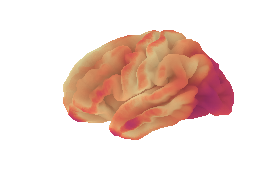

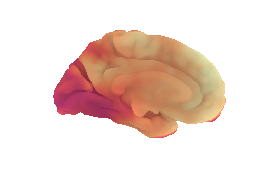

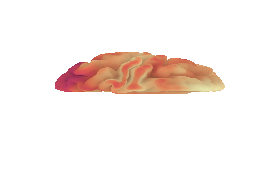

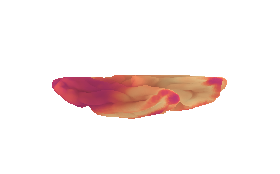

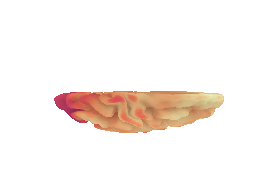

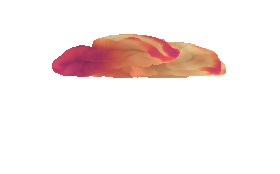

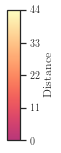

In [105]:
# Occipital lobe
occipital_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=src_dist['occ-dist'])
occipital_nii = vol_to_nii(occipital_vol, name='occipital-lobe')
plot_dist_surfmaps(occipital_nii, 
                   name='occipital-lobe', 
                   mesh='fsaverage', 
                   cmap='magma')

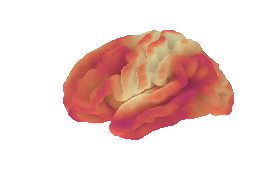

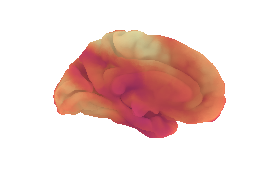

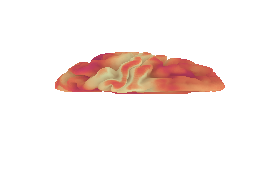

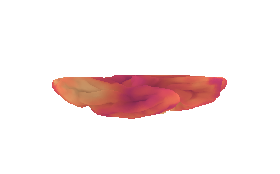

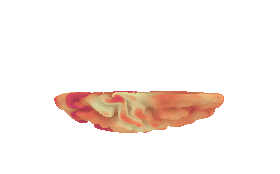

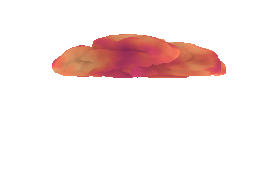

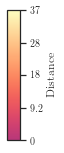

In [106]:
# Hippocampus
hippocampus_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=src_dist['hippo-dist'])
hippocampus_nii = vol_to_nii(hippocampus_vol, name='hippocampus')
plot_dist_surfmaps(hippocampus_nii, 
                   name='hippocampus', 
                   mesh='fsaverage', 
                   cmap='magma')

## Contour plots

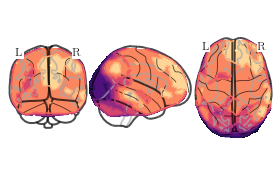

In [108]:
f, ax = plt.subplots(figsize=set_size(345))
occipital_display = plot_glass_brain(None, display_mode='ortho', axes=ax)
occipital_display.add_contours(occipital_nii,
                               filled=True,
                               threshold=0,
                               cmap='magma')

f.savefig(f'{path}/figures/occipital-lobe-glass-brain-distance-contour.png',
          dpi=300)

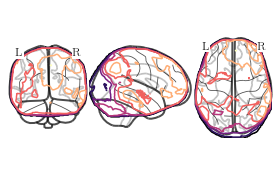

In [109]:
f, ax = plt.subplots(figsize=set_size(345))
occipital_display = plot_glass_brain(None, display_mode='ortho', axes=ax)
occipital_display.add_contours(occipital_nii,
                               threshold=0,
                               cmap='magma')

f.savefig(f'{path}/figures/occipital-lobe-glass-brain-distance-contour-lines.png',
          dpi=300)

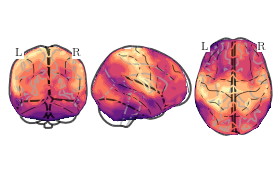

In [110]:
f, ax = plt.subplots(figsize=set_size(345))
hippo_display = plot_glass_brain(None, display_mode='ortho', axes=ax)
hippo_display.add_contours(hippocampus_nii,
                           filled=True,
                           threshold=src_dist['hippo-dist'].min(),
                           cmap='magma')

f.savefig(f'{path}/figures/hippocampus-glass-brain-distance-contour.png',
          dpi=300)

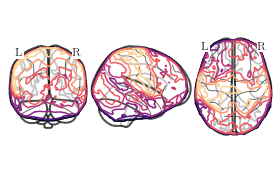

In [111]:
f, ax = plt.subplots(figsize=set_size(345))
hippo_display = plot_glass_brain(None, display_mode='ortho', axes=ax)
hippo_display.add_contours(hippocampus_nii,
                           threshold=src_dist['hippo-dist'].min(),
                           cmap='magma')

f.savefig(f'{path}/figures/hippocampus-glass-brain-distance-contour-lines.png',
          dpi=300)

## Precuneus

- Try $k$-means clustering to identify the two precuneus centroids in the isomap embedding.
- Generate a cluster-wise distance for all nodes
- Interpolate and plot cortical surface

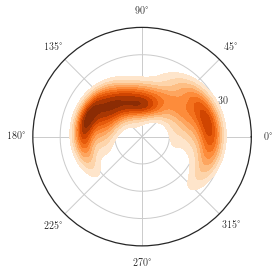

In [112]:
# Precuneus kdeplot
f = plt.figure(figsize=set_size(width))

ax = f.add_subplot(projection='polar')

sns.kdeplot(src_dist.loc[src_dist['roi'] == 'Precuneus', 'theta'],
            src_dist.loc[src_dist['roi'] == 'Precuneus', 'r'],
           cmap='Oranges', shade=True, shade_lowest=False)

ax.set_aspect('equal')
#ax.set_title('', pad=30)
ax.set_ylim(0, 40)
ax.set_yticks(np.arange(10, 40, step=10))
ax.set_yticklabels([10, 20, 30])
ax.set_xlabel('')
ax.set_ylabel('')

f.savefig(f'{path}/figures/isomap-precuneus-kde.pdf', dpi=300, transparent=True)

In [113]:
# k-means to determine centroids of precuneus
precuneus_xy = src_dist.loc[src_dist['roi'] == 'Precuneus', ['x', 'y']].to_numpy()
precuneus_kmeans = KMeans(n_clusters=2, random_state=0).fit(precuneus_xy)

precuneus_df = src_dist.loc[src_dist['roi'] == 'Precuneus', ['x', 'y', 'r', 'theta']].copy()
precuneus_df['cluster'] = pd.Series(precuneus_kmeans.labels_, dtype='category', index=precuneus_df.index)

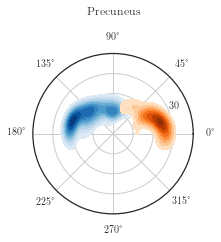

In [114]:
# Precuneus kdeplot

cluster0 = precuneus_df.loc[precuneus_df['cluster'] == 0]
cluster1 = precuneus_df.loc[precuneus_df['cluster'] == 1]

f = plt.figure(figsize=set_size(345))

ax = f.add_subplot(projection='polar')

sns.kdeplot(cluster0['theta'], cluster0['r'], cmap='Blues', shade=True, 
            shade_lowest=False, ax=ax)

sns.kdeplot(cluster1['theta'], cluster1['r'], cmap='Oranges', shade=True, 
            shade_lowest=False, ax=ax)

ax.set_aspect('equal')
ax.set_title('Precuneus', pad=30)
ax.set_ylim(0, 40)
ax.set_yticks(np.arange(10, 40, step=10))
ax.set_yticklabels([10, 20, 30])
ax.set_xlabel('')
ax.set_ylabel('')

f.savefig(f'{path}/figures/isomap-precuneus-kde-clusters.png', dpi=300, transparent=True)

In [115]:
centroid0 = precuneus_kmeans.cluster_centers_[0]
centroid1 = precuneus_kmeans.cluster_centers_[1]

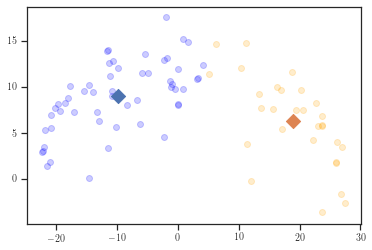

In [116]:
f, ax = plt.subplots()
ax.scatter(cluster0['x'], cluster0['y'], color='blue', alpha='0.2')

ax.scatter(centroid0[0],
           centroid0[1],
           color='C0',
           s=100,
           marker='D')

ax.scatter(cluster1['x'], cluster1['y'], color='orange', alpha='0.2')

ax.scatter(centroid1[0],
           centroid1[1],
           color='C1',
           s=100,
           marker='D')

In [117]:
src_dist['c0-precun'] = edist(src_dist[['x', 'y']].to_numpy(), 
                              centroid0.reshape(1, -1))

src_dist['c1-precun'] = edist(src_dist[['x', 'y']].to_numpy(), 
                              centroid1.reshape(1, -1))

In [118]:
precuneus_c0_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=src_dist['c0-precun'])
precuneus_c0_nii = vol_to_nii(precuneus_c0_vol, name='precuneus-c0')

precuneus_c1_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=src_dist['c1-precun'])
precuneus_c1_nii = vol_to_nii(precuneus_c1_vol, name='precuneus-c1')

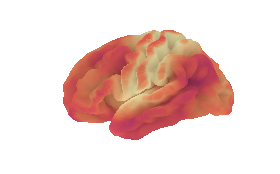

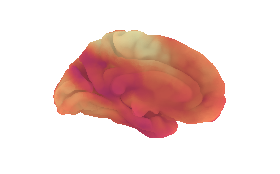

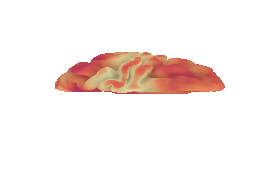

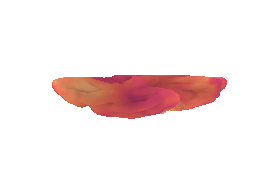

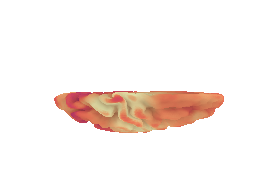

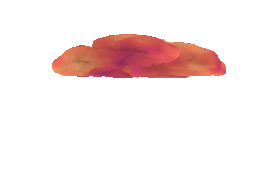

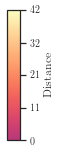

In [119]:
plot_dist_surfmaps(precuneus_c0_nii, 
                   name='precuneus-c0', 
                   mesh='fsaverage', 
                   cmap='magma')

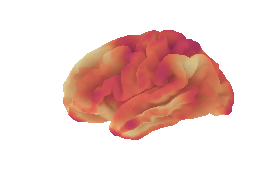

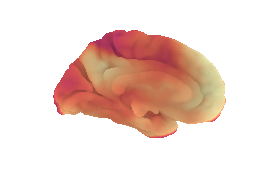

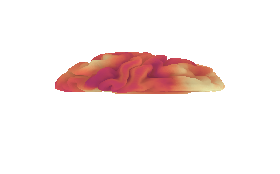

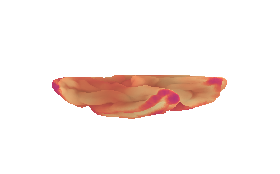

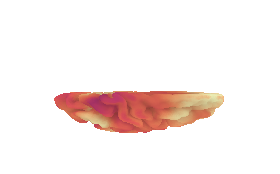

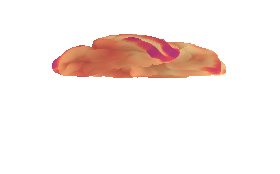

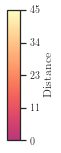

In [120]:
plot_dist_surfmaps(precuneus_c1_nii, 
                   name='precuneus-c1', 
                   mesh='fsaverage', 
                   cmap='magma')

## Diverging colormap for precuneus

In [121]:
c0_idx = precuneus_df.loc[precuneus_df['cluster'] == 0].index.to_numpy()
c1_idx = precuneus_df.loc[precuneus_df['cluster'] == 1].index.to_numpy()

In [122]:
def assign_cluster(c0_idx, c1_idx, df):
    """Assigns cluster affiliation to all regions in a dataset based on their
    distance to clusters based on a subset of the data.
    
    Parameters
    ----------
    c0_idx, c1_idx : numpy vector, pandas series
        Indices of the regions belonging to two previously determined clusters
        (e.g., from k-means). The indices must be in reference to the original
        N data.
        
    df : pandas dataframe
        Dataframe containing the (x,y)-coordinates for each region and the distance
        of each region to each of the cluster centroids
        
    Returns
    -------
    C : numpy vector
        Cluster assignment vector {0, 1} for each region.
    """
    
    c0_coords = df.iloc[c0_idx][['x', 'y']]
    c1_coords = df.iloc[c1_idx][['x', 'y']]
    region_coords = df[['x', 'y']].to_numpy()
    
    C = np.zeros(len(df))
    
    for i in range(len(region_coords)):
        d_c0_min = edist(c0_coords, region_coords[i].reshape(1, 2)).min()
        d_c1_min = edist(c1_coords, region_coords[i].reshape(1, 2)).min()
        
        if d_c1_min < d_c0_min:
            C[i] = 1
            
    return C   


src_dist['precuneus-cluster'] = pd.Series(assign_cluster(c0_idx, c1_idx, src_dist), dtype=int)

In [123]:
c0_dist = src_dist.loc[src_dist['precuneus-cluster'] == 0, 'c0-precun']
c0_dist = c0_dist.max() - c0_dist

c1_dist = src_dist.loc[src_dist['precuneus-cluster'] == 1, 'c1-precun']
c1_dist = c1_dist - c1_dist.max()

src_dist['precuneus-div'] = np.zeros(len(src_dist))
src_dist.loc[src_dist['precuneus-cluster'] == 0, 'precuneus-div'] = c0_dist
src_dist.loc[src_dist['precuneus-cluster'] == 1, 'precuneus-div'] = c1_dist

centroid_r, centroid_theta = coord_polar(precuneus_kmeans.cluster_centers_)

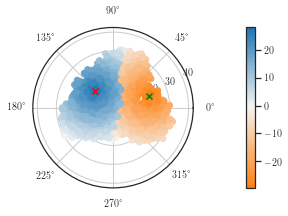

In [124]:
f, ax = plt.subplots(figsize=set_size(345), subplot_kw={'projection': 'polar'})

norm = matplotlib.colors.DivergingNorm(vmin=src_dist['precuneus-div'].min(),
                                       vcenter=0,
                                       vmax=src_dist['precuneus-div'].max())

im = ax.scatter(src_dist['theta'], src_dist['r'], c=src_dist['precuneus-div'], 
                cmap=BuOr_mpl, norm=norm)

ax.scatter(centroid_theta[0], centroid_r[0], color='red', marker='x')
ax.scatter(centroid_theta[1], centroid_r[1], color='green', marker='x')

f.colorbar(im, ax=ax, pad=0.2)
f.savefig(f'{path}/figures/isomap-precuneus-div.svg', dpi=300, transparent=True)

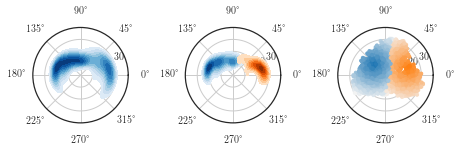

In [125]:
# Precuneus kdeplot
fig_width_in, _ = set_size(width, subplots=(1, 3))

f, ax = plt.subplots(1, 3, 
                     figsize=(fig_width_in, 3), 
                     subplot_kw={'projection': 'polar'})

# All precuneus regions combined
sns.kdeplot(src_dist.loc[src_dist['roi'] == 'Precuneus', 'theta'],
            src_dist.loc[src_dist['roi'] == 'Precuneus', 'r'],
            cmap='Blues', shade=True, shade_lowest=False, ax=ax[0])

ax[0].set_aspect('equal')
ax[0].set_ylim(0, 40)
ax[0].set_yticks(np.arange(10, 40, step=10))
ax[0].set_yticklabels([10, 20, 30])
ax[0].set_xlabel('')
ax[0].set_ylabel('')

# Precuneus k-means clusters
cluster0 = precuneus_df.loc[precuneus_df['cluster'] == 0]
cluster1 = precuneus_df.loc[precuneus_df['cluster'] == 1]

sns.kdeplot(cluster0['theta'], cluster0['r'], cmap='Blues', shade=True, 
            shade_lowest=False, ax=ax[1])

sns.kdeplot(cluster1['theta'], cluster1['r'], cmap='Oranges', shade=True, 
            shade_lowest=False, ax=ax[1])

ax[1].set_aspect('equal')
ax[1].set_ylim(0, 40)
ax[1].set_yticks(np.arange(10, 40, step=10))
ax[1].set_yticklabels([10, 20, 30])
ax[1].set_xlabel('')
ax[1].set_ylabel('')

# Metaclusters
norm = matplotlib.colors.DivergingNorm(vmin=src_dist['precuneus-div'].min(),
                                       vcenter=0,
                                       vmax=src_dist['precuneus-div'].max())

im = ax[2].scatter(src_dist['theta'], src_dist['r'], c=src_dist['precuneus-div'], 
                   cmap=BuOr_mpl, norm=norm, s=10)

ax[2].set_aspect('equal')
ax[2].set_ylim(0, 40)
ax[2].set_yticks(np.arange(10, 40, step=10))
ax[2].set_yticklabels([10, 20, 30])

f.tight_layout()

f.savefig(f'{path}/figures/isomap-precuneus-all-and-kmeans.pdf', dpi=300)

In [126]:
# Get MNI coordinates of ROI closest to centroid for each cluster
c0_closest_idx = (src_dist
                  .sort_values('c0-precun')
                  .loc[src_dist['roi'] == 'Precuneus']
                  .index[0])

c1_closest_idx = (src_dist
                  .sort_values('c1-precun')
                  .loc[src_dist['roi'] == 'Precuneus']
                  .index[0])
c1_closest_idx

precun_closest_mni = h2514.roi_xyz.iloc[[c0_closest_idx, c1_closest_idx], :]
precun_closest_mni

,x,y,z
1201,9,-45,11
2485,8,-51,61


In [127]:
c0_count = (src_dist
            .loc[src_dist['precuneus-cluster'] == 0]
            .sort_values('c0-precun')
            .groupby('lobe')
            .size()
            .sort_values()
            .reset_index()
            .rename(columns={0: 'N'}))

c0_count

,lobe,N
0,Brainstem,15
1,Occipital Lobe,73
2,Parietal Lobe,104
3,Limbic Lobe,174
4,Sub-lobar,189
5,Cerebellum,236
6,Temporal Lobe,290
7,Frontal Lobe,469


In [128]:
c0_roi_count = (src_dist
                .loc[src_dist['precuneus-cluster'] == 0]
                .sort_values('c0-precun')
                .groupby('roitex')
                .size()
                .sort_values()
                .tail(n=10)
                .reset_index()
                .rename(columns={0: 'N'}))

c0_roi_count

,roitex,N
0,Caudate,48
1,Thalamus,52
2,Precuneus,54
3,Fusiform,55
4,Frontal Sup,73
5,Frontal Sup Medial,76
6,Temporal Inf,89
7,Frontal Mid,112
8,Temporal Mid,113
9,Cerebellum,177


In [129]:
c0_roi_means = (src_dist
                .loc[src_dist['precuneus-cluster'] == 0, ['roitex', 'lobe', 'precuneus-div']]
                .groupby('roitex')
                .agg(['mean'])
                .sort_values(('precuneus-div', 'mean'), ascending=False)
                .head(n=10)
)

c0_roi_means

,precuneus-div
,mean
roitex,
Hippocampus,21.014246
Cuneus,20.996839
Vermis,20.680380
Precuneus,20.570938
Cerebellum,19.986254
ParaHippocampal,19.553908
Cingulum Post,18.961932
Calcarine,18.128343


In [130]:
c0_roi_strip = (src_dist
                .loc[src_dist['roitex'].isin(c0_roi_means.index) &
                     (src_dist['precuneus-cluster'] == 0), ['roitex', 'precuneus-div']]
               )

c0_roi_strip

,roitex,precuneus-div
1,ParaHippocampal,20.053066
9,Cerebellum,19.956632
14,Cerebellum,21.728700
20,Hippocampus,20.424405
41,Cerebellum,16.761766
56,Cerebellum,19.786876
59,Cerebellum,20.103487
64,Cerebellum,18.157322
78,Calcarine,19.435153
88,Hippocampus,23.503950


In [131]:
c1_count = (src_dist
            .loc[src_dist['precuneus-cluster'] == 1]
            .sort_values('c1-precun')
            .groupby('lobe')
            .size()
            .sort_values()
            .reset_index()
            .rename(columns={0: 'N'}))
c1_count

,lobe,N
0,Brainstem,1
1,Cerebellum,22
2,Limbic Lobe,46
3,Temporal Lobe,79
4,Sub-lobar,105
5,Occipital Lobe,132
6,Parietal Lobe,239
7,Frontal Lobe,340


In [132]:
c1_roi_count = (src_dist
                .loc[src_dist['precuneus-cluster'] == 1]
                .sort_values('c1-precun')
                .groupby('roitex')
                .size()
                .sort_values()
                .tail(n=10)
                .reset_index()
                .rename(columns={0: 'N'}))

c1_roi_count

,roitex,N
0,Parietal Sup,38
1,Occipital Mid,38
2,SupraMarginal,40
3,Cingulum Mid,42
4,Frontal Mid,45
5,Insula,49
6,Supp Motor Area,50
7,Temporal Sup,53
8,Precentral,85
9,Postcentral,97


In [133]:
c1_roi_means = (src_dist
                .loc[src_dist['precuneus-cluster'] == 1, ['roitex', 'lobe', 'precuneus-div']]
                .groupby('roitex')
                .agg(['mean'])
                .sort_values(('precuneus-div', 'mean'))
                .head(n=10)
)

c1_roi_means

,precuneus-div
,mean
roitex,
Precuneus,-23.078422
Parietal Sup,-21.899656
Cuneus,-18.366174
Angular,-17.820462
Paracentral Lobule,-16.823425
Temporal Mid,-15.905621
Thalamus,-15.745483
Temporal Inf,-15.422076


In [134]:
c1_roi_strip = (src_dist
                .loc[src_dist['roitex'].isin(c1_roi_means.index) &
                     (src_dist['precuneus-cluster'] == 1), ['roitex', 'precuneus-div']]
               )

c1_roi_strip

,roitex,precuneus-div
3,Cuneus,-15.617378
10,Temporal Mid,-14.042162
29,Parietal Inf,-11.341403
39,Precuneus,-25.255976
51,Paracentral Lobule,-16.250539
53,Parietal Sup,-23.366019
60,Parietal Inf,-21.500811
81,Temporal Sup,-14.064905
87,Parietal Inf,-25.168724
97,Precuneus,-26.408200


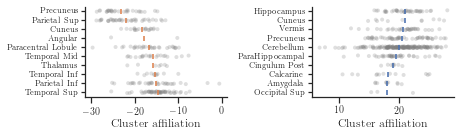

In [135]:
f, ax = plt.subplots(1, 2, figsize=set_size(width, subplots=(1, 2)))

strip_data = [c1_roi_strip, c0_roi_strip]
point_data = [c1_roi_means, c0_roi_means]
colors = ['C1', 'C0']

# Cluster 1
for i in range(2):
    sns.stripplot(data=strip_data[i], 
                  x='precuneus-div', 
                  y='roitex', 
                  order=point_data[i].index,
                  color='gray',
                  size=4,
                  alpha=0.25,
                  zorder=1, 
                  ax=ax[i])

    sns.pointplot(x=point_data[i][('precuneus-div', 'mean')], 
                  y=point_data[i].index, 
                  color=colors[i], 
                  markers='|',
                  scale=0.8,
                  join=False,
                  ax=ax[i])

for axx in ax:
    axx.tick_params(axis='y', labelsize=8, size=4)
    axx.set(xlabel='Cluster affiliation', ylabel='')

    sns.despine(f)

f.tight_layout()
f.savefig(f'{path}/figures/precuneus-10roi-near-centroids.svg', dpi=300)

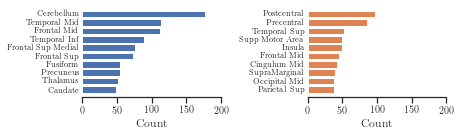

In [137]:
fig_width_in, fig_height_in = set_size(width, subplots=(1, 2))

f, ax = plt.subplots(1, 2, 
                     figsize=(fig_width_in, fig_height_in))

ax[0].barh(c0_roi_count['roitex'], c0_roi_count['N'], color='C0')

ax[1].barh(c1_roi_count['roitex'], c1_roi_count['N'], color='C1')

for axx in ax:
    axx.spines['top'].set_visible(False)
    axx.spines['right'].set_visible(False)
    axx.spines['left'].set_visible(False)
    axx.tick_params(axis='y', labelsize=8, size=0)
    axx.set_xlim(0, 200)
    axx.set_xlabel('Count')

f.tight_layout()
f.savefig(f'{path}/figures/precuneus-cluster-counts.svg', dpi=300)

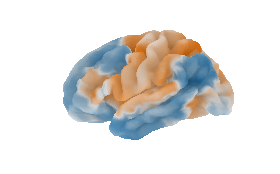

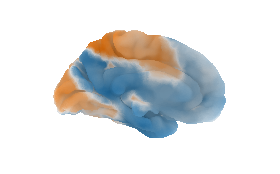

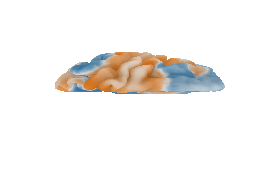

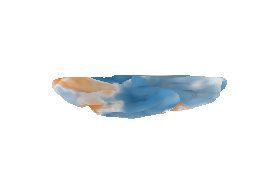

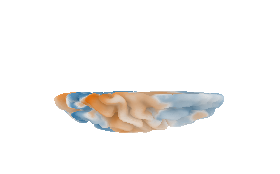

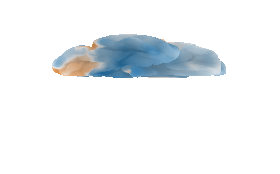

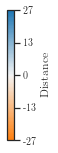

In [138]:
precuneus_div_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=src_dist['precuneus-div'])
tm = f'{path}/data/saved_data/surface_maps/hippocampus-tm.mat' 
precuneus_div_nii = vol_to_nii(precuneus_div_vol, 
                               name='precuneus-div', 
                               apply_xfm=True,
                               in_matrix_file=tm)

norm = matplotlib.colors.DivergingNorm(vmin=src_dist['precuneus-div'].min(),
                                       vcenter=0,
                                       vmax=src_dist['precuneus-div'].max())

# No threshold
plot_dist_surfmaps(precuneus_div_nii, 
                   name='precuneus-div', 
                   mesh='fsaverage', 
                   cmap=BuOr_mpl, 
                   norm=norm)

## Map MMD gradient to cortical surface

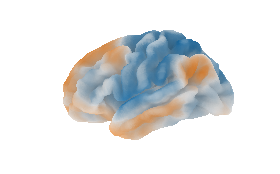

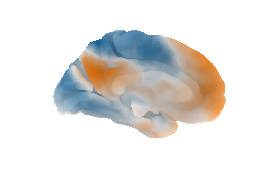

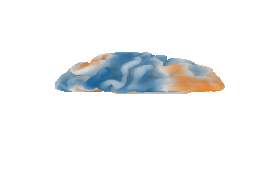

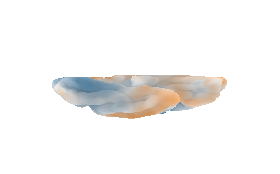

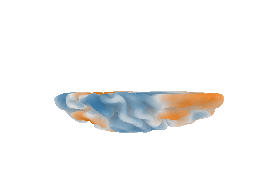

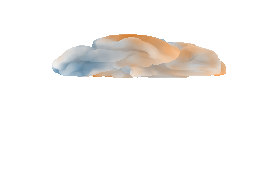

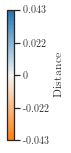

In [139]:
mmd_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=h2514.qmax)

tm = f'{path}/data/saved_data/surface_maps/hippocampus-tm.mat'  # gives better registration
mmd_nii = vol_to_nii(mmd_vol, name='mmd', apply_xfm=True, in_matrix_file=tm)

# Set diverging colormap to center at 0
offset = matplotlib.colors.DivergingNorm(vmin=h2514.qmax.min(),
                                         vcenter=0,
                                         vmax=h2514.qmax.max())

plot_dist_surfmaps(mmd_nii, 
                   name='mmd', 
                   mesh='fsaverage', 
                   cmap=BuOr_mpl, 
                   norm=offset)